# PUBG-Guide to Ultimate Chicken Dinner

## About the Project

- PlayerUnknown's Battlegrounds is an online multiplayer battle royale game.
- The game features the last man standing deathmatch mode, in which one hundred players fight against each other in a battle royale.
- People can play as individuals or as a team of up to 4 players. There are various strategies that people follow in order to win the game.
- The last person or team alive wins the match.


## Data Preprocessing
- We eliminated the null values in our dataset by dropping the rows with those null values.
- We have normalized/standardized the data before model implementation.
- During our model implementation we have dropped certain columns which are irrelevant for our analysis such as MatchId or MatchType

## Problem Statement
1)      To predict the final ranks of players based on their characteristics.

2)      To identify the strategies used by top rank players to survive in the game.

In [1]:

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from math import sqrt
#seed
import random
random.seed(30) #seed for reproducibility
#ml 
from sklearn.cluster import KMeans
from sklearn import preprocessing
from sklearn.decomposition import PCA
#viz
import matplotlib.pyplot as plt #plots and graphs
import seaborn as sns #additional functionality and visualization
plt.style.use('fivethirtyeight')#set style
%matplotlib inline

## We picked our dataset from Kaggle.
## To view our datasets and additional attachments please follow this link:
### https://drive.google.com/drive/folders/1rFac7r-b_noMZz-OU_GIw5VfQU23rnc1?usp=sharing

In [3]:
#load data and create dataframe 
train_data = pd.read_csv("/Users/prashasyasrivastava/Downloads/train.csv")
#summarize information 
print("database shape:",train_data.shape)
before = train_data.shape
print("missing data?",train_data.isnull().values.any())
print("deleting missing values...")# dataframe has missing values, we will drop them because of time constraints. Usually not desirable since missing information can actually provide with important insights.
train_data = train_data.dropna()
print("missing data?",train_data.isnull().values.any())
after = train_data.shape
#print("using random sample (1% of data) to speed up computation...")
#train_data = train_data.sample(n=None, frac=0.01, replace=False, weights=None, random_state=None, axis=None)
print("database shape:",train_data.shape)
print("Dropped rows:",before[0]-after[0])
train_data.head()

database shape: (4446966, 29)
missing data? True
deleting missing values...
missing data? False
database shape: (4446965, 29)
Dropped rows: 1


,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,...,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
0,7f96b2f878858a,4d4b580de459be,a10357fd1a4a91,0,0,0.00,0,0,0,60,...,0,0.0000,0,0.00,0,0,244.80,1,1466,0.4444
1,eef90569b9d03c,684d5656442f9e,aeb375fc57110c,0,0,91.47,0,0,0,57,...,0,0.0045,0,11.04,0,0,1434.00,5,0,0.6400
2,1eaf90ac73de72,6a4a42c3245a74,110163d8bb94ae,1,0,68.00,0,0,0,47,...,0,0.0000,0,0.00,0,0,161.80,2,0,0.7755
3,4616d365dd2853,a930a9c79cd721,f1f1f4ef412d7e,0,0,32.90,0,0,0,75,...,0,0.0000,0,0.00,0,0,202.70,3,0,0.1667
4,315c96c26c9aac,de04010b3458dd,6dc8ff871e21e6,0,0,100.00,0,0,0,45,...,0,0.0000,0,0.00,0,0,49.75,2,0,0.1875


In [4]:
train_data.describe()

,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,...,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
count,4.446965e+06,4.446965e+06,4.446965e+06,4.446965e+06,4.446965e+06,4.446965e+06,4.446965e+06,4.446965e+06,4.446965e+06,4.446965e+06,...,4.446965e+06,4.446965e+06,4.446965e+06,4.446965e+06,4.446965e+06,4.446965e+06,4.446965e+06,4.446965e+06,4.446965e+06,4.446965e+06
mean,2.338150e-01,1.106908e+00,1.307172e+02,6.578757e-01,2.268196e-01,1.370148e+00,4.759936e+01,5.050062e+02,9.247835e-01,5.439553e-01,...,1.646590e-01,6.061158e+02,3.496092e-03,4.509323e+00,2.386841e-02,7.918209e-03,1.154218e+03,3.660488e+00,6.064603e+02,4.728216e-01
std,5.885731e-01,1.715794e+00,1.707806e+02,1.145743e+00,6.021553e-01,2.679982e+00,2.746293e+01,6.275049e+02,1.558445e+00,7.109721e-01,...,4.721671e-01,1.498344e+03,7.337297e-02,3.050220e+01,1.673935e-01,9.261158e-02,1.183497e+03,2.456543e+00,7.397005e+02,3.074050e-01
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.400000e+01,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.551000e+02,2.000000e+00,0.000000e+00,2.000000e-01
50%,0.000000e+00,0.000000e+00,8.424000e+01,0.000000e+00,0.000000e+00,0.000000e+00,4.700000e+01,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,6.856000e+02,3.000000e+00,0.000000e+00,4.583000e-01
75%,0.000000e+00,2.000000e+00,1.860000e+02,1.000000e+00,0.000000e+00,2.000000e+00,7.100000e+01,1.172000e+03,1.000000e+00,1.000000e+00,...,0.000000e+00,1.910000e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.976000e+03,5.000000e+00,1.495000e+03,7.407000e-01
max,2.200000e+01,3.300000e+01,6.616000e+03,5.300000e+01,6.400000e+01,8.000000e+01,1.010000e+02,2.170000e+03,7.200000e+01,2.000000e+01,...,3.900000e+01,4.071000e+04,1.800000e+01,3.823000e+03,1.200000e+01,5.000000e+00,2.578000e+04,2.360000e+02,2.013000e+03,1.000000e+00


In [5]:
train_data["Id"].describe()

count            4446965
unique           4446965
top       7ddbb2dfbac2e1
freq                   1
Name: Id, dtype: object

In [6]:
#we will drop winning placement and all features that do not represent player behaviour
cluster_data = train_data.iloc[:,3:-2]
cluster_data= cluster_data.drop(["matchType","rankPoints","maxPlace","killPlace",
                                "killPoints","matchDuration","numGroups"],axis=1)
print("Database shape: ",cluster_data.shape)
cluster_data.head()

Database shape:  (4446965, 17)


,assists,boosts,damageDealt,DBNOs,headshotKills,heals,kills,killStreaks,longestKill,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired
0,0,0,0.00,0,0,0,0,0,0.00,0,0.0000,0,0.00,0,0,244.80,1
1,0,0,91.47,0,0,0,0,0,0.00,0,0.0045,0,11.04,0,0,1434.00,5
2,1,0,68.00,0,0,0,0,0,0.00,0,0.0000,0,0.00,0,0,161.80,2
3,0,0,32.90,0,0,0,0,0,0.00,0,0.0000,0,0.00,0,0,202.70,3
4,0,0,100.00,0,0,0,1,1,58.53,0,0.0000,0,0.00,0,0,49.75,2


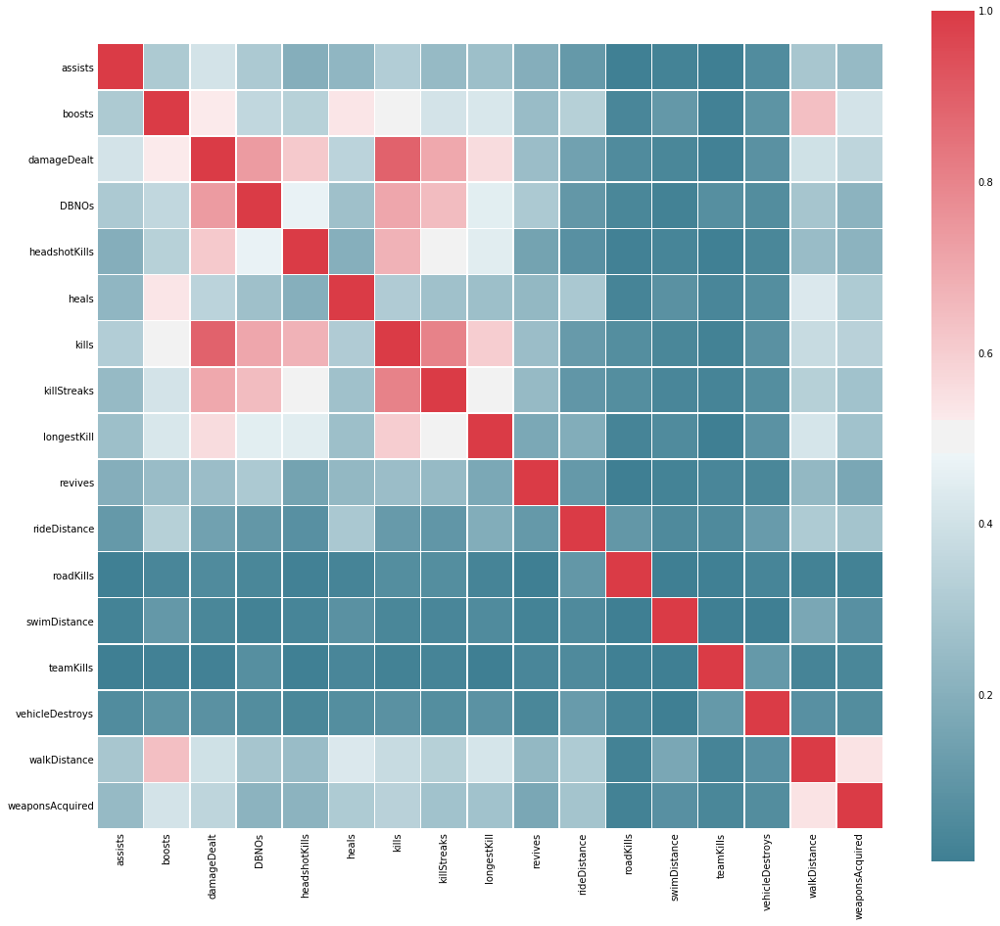

In [7]:
#developing a heatmap with example from https://seaborn.pydata.org/examples/many_pairwise_correlations.html
corr = cluster_data.corr() # compute correlation matrix
f, ax = plt.subplots(figsize=(16,16)) #set size
cmap = sns.diverging_palette(220,10,as_cmap=True) #define a custom color palette
sns.heatmap(corr,annot=False,cmap=cmap,square=True,linewidths=0.5) #draw graph
plt.show()

In [8]:
#top n correlations
n=10
def get_redundant_pairs(df):
    '''Get diagonal and lower triangular pairs of correlation matrix'''
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

def get_top_abs_correlations(df, n=5):
    au_corr = df.corr().abs().unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[0:n]

print(get_top_abs_correlations(corr,n))

damageDealt    kills            0.984001
kills          killStreaks      0.958780
damageDealt    killStreaks      0.924225
               DBNOs            0.922088
DBNOs          kills            0.911901
               killStreaks      0.894238
headshotKills  kills            0.882581
damageDealt    headshotKills    0.850146
boosts         walkDistance     0.823171
kills          longestKill      0.810217
dtype: float64


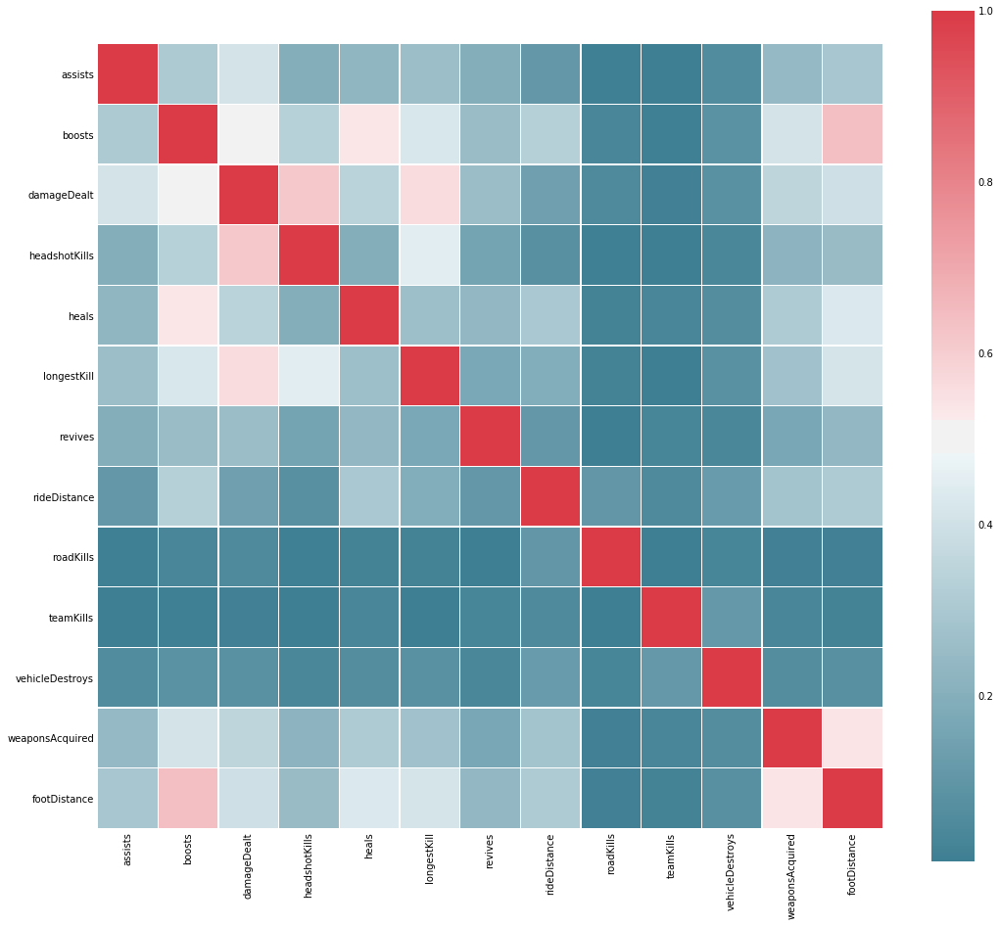

In [9]:
#create footDistance feature and drop highly correlated features
cluster_data['footDistance'] = cluster_data['walkDistance'] + cluster_data['swimDistance']
cluster_data= cluster_data.drop(["kills","killStreaks","DBNOs","walkDistance","swimDistance"],axis=1)

#developing a heatmap with example from https://seaborn.pydata.org/examples/many_pairwise_correlations.html
corr = cluster_data.corr() # compute correlation matrix
f, ax = plt.subplots(figsize=(16,16)) #set size
cmap = sns.diverging_palette(220,10,as_cmap=True) #define a custom color palette
sns.heatmap(corr,annot=False,cmap=cmap,square=True,linewidths=0.5) #draw graph
plt.show()

In [11]:
import sys
import warnings

if not sys.warnoptions:
    warnings.simplefilter("ignore")

In [12]:
#we also standardize the data, clustering algorithms are sensitive to scale for measuring distance
standardized = preprocessing.scale(cluster_data)
#building the df again
df_labels = cluster_data.iloc[:0].columns
st_cluster_data = pd.DataFrame(standardized, columns=df_labels)
st_cluster_data.head()

,assists,boosts,damageDealt,headshotKills,heals,longestKill,revives,rideDistance,roadKills,teamKills,vehicleDestroys,weaponsAcquired,footDistance
0,-0.397257,-0.645129,-0.765410,-0.37668,-0.511252,-0.451176,-0.34873,-0.404524,-0.047648,-0.142589,-0.085499,-1.083021,-0.768661
1,-0.397257,-0.645129,-0.229810,-0.37668,-0.511252,-0.451176,-0.34873,-0.404521,-0.047648,-0.142589,-0.085499,0.545283,0.240804
2,1.301767,-0.645129,-0.367238,-0.37668,-0.511252,-0.451176,-0.34873,-0.404524,-0.047648,-0.142589,-0.085499,-0.675945,-0.838468
3,-0.397257,-0.645129,-0.572765,-0.37668,-0.511252,-0.451176,-0.34873,-0.404524,-0.047648,-0.142589,-0.085499,-0.268869,-0.804069
4,-0.397257,-0.645129,-0.179863,-0.37668,-0.511252,0.697088,-0.34873,-0.404524,-0.047648,-0.142589,-0.085499,-0.675945,-0.932708


Text(0.5, 0, 'Player actions distribution')

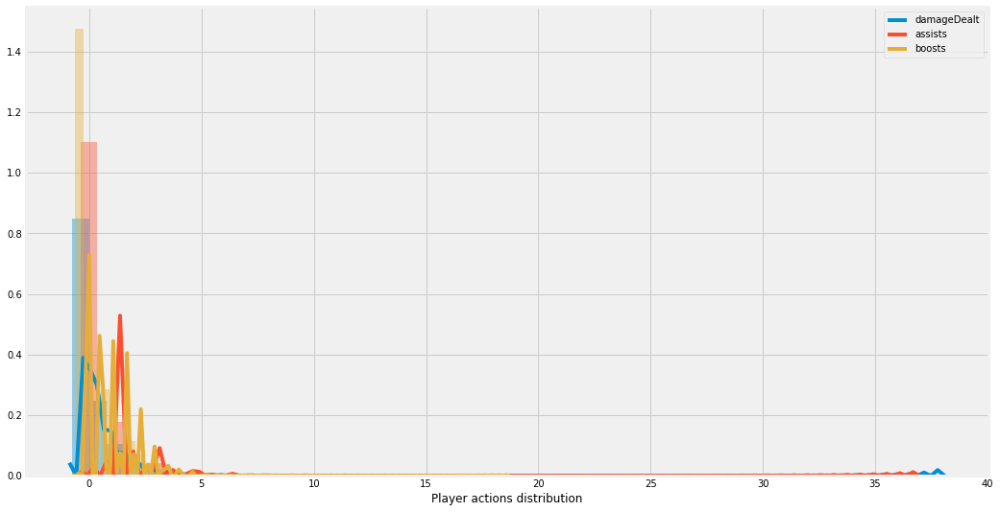

In [13]:
#plot distribution
plt.rcParams['figure.figsize'] = (16, 9)
plot_1 = sns.distplot(st_cluster_data["damageDealt"], kde_kws={"label": "damageDealt"})
plot_2 = sns.distplot(st_cluster_data["assists"], kde_kws={"label": "assists"})
plot_3 = sns.distplot(st_cluster_data["boosts"], kde_kws={"label": "boosts"})
plt.xlabel('Player actions distribution')

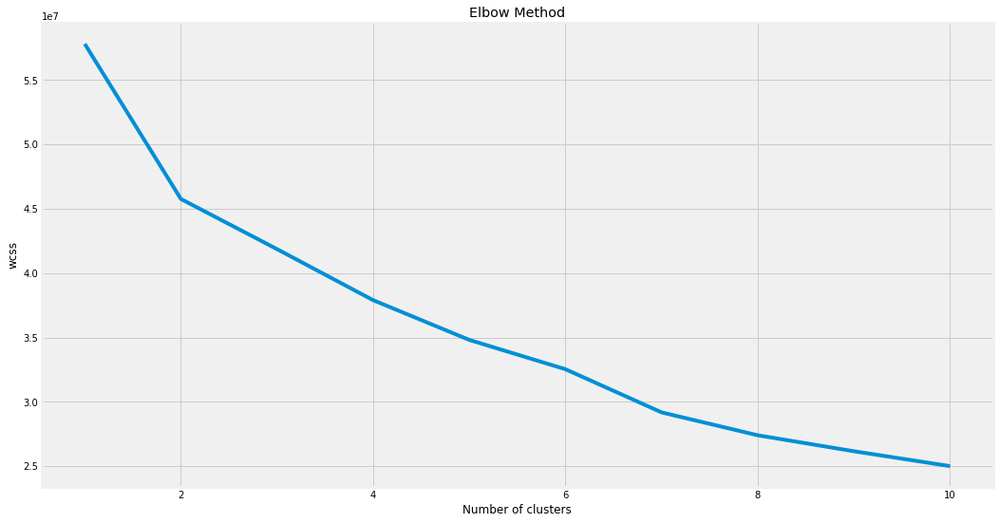

In [14]:
#Using the elbow method to find the optimum number of clusters
wcss = []
for i in range(1,11):
    km=KMeans(n_clusters=i,init='k-means++', max_iter=300, n_init=10, random_state=30)
    km.fit(st_cluster_data)
    wcss.append(km.inertia_)
plt.plot(range(1,11),wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('wcss')
plt.show()

### Data Pre-processing using K-means Clustering.
### We are using the radar_plots for visualization.

In [15]:
# Fitting K-Means to the dataset
num_clusters = 4
kmeans = KMeans(n_clusters=num_clusters,
                init='k-means++',
                max_iter=1000,
                n_init=20,
                random_state=30)
y_kmeans = kmeans.fit_predict(st_cluster_data)

In [16]:
#we can change the beginning of  the cluster numbering to 1 instead of 0 (optional)
y_kmeans1=y_kmeans
y_kmeans1=y_kmeans+1
# New Dataframe called cluster
cluster = pd.DataFrame(y_kmeans1)
# Adding cluster to the Dataset1
cluster_data['cluster'] = cluster
#Mean of clusters
kmeans_mean_cluster = pd.DataFrame(round(cluster_data.groupby('cluster').mean(),4))
#trasnponse for easier visualization
kmeans_mean_cluster

,assists,boosts,damageDealt,headshotKills,heals,longestKill,revives,rideDistance,roadKills,teamKills,vehicleDestroys,weaponsAcquired,footDistance
cluster,,,,,,,,,,,,,
1.0,0.1435,0.5448,92.6614,0.1413,0.7015,12.6356,0.0965,285.1065,0.0017,0.0178,0.0030,2.9338,702.8814
2.0,0.2631,1.6746,137.1168,0.1875,2.1086,23.1427,0.2196,1095.6231,0.0056,0.0338,0.0031,4.7346,1789.3410
3.0,0.6779,2.8171,334.7149,0.8406,3.2318,82.7496,0.4109,1067.6138,0.0069,0.0222,0.0030,4.9371,2083.3436
4.0,0.4706,2.1747,227.4378,0.3914,2.5787,53.1114,0.2903,1885.5096,0.0188,0.1607,0.6455,4.7420,1806.9049


In [17]:
for i in range(4):
    obs = cluster_data["cluster"].where(cluster_data["cluster"]==i+1).count()
    percentage = round(cluster_data["cluster"].where(cluster_data["cluster"]==i+1).count()/cluster_data["cluster"].count()*100,2)
    print("Cluster {} has".format(i+1),obs, "players, or {}%".format(percentage))

Cluster 1 has 2703114 players, or 60.79%
Cluster 2 has 1261405 players, or 28.37%
Cluster 3 has 448688 players, or 10.09%
Cluster 4 has 33757 players, or 0.76%


In [18]:
#we standardize the data to visualize it in the same scale
radar_data = preprocessing.scale(kmeans_mean_cluster)
radar_data = pd.DataFrame(radar_data)
radar_data

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-1.203129,-1.512780,-1.136361,-0.900047,-1.564368,-1.105726,-1.385223,-1.410730,-1.025914,-0.689354,-0.577470,-1.723414,-1.689358
1,-0.616464,-0.154164,-0.656711,-0.732983,-0.050096,-0.721968,-0.304780,0.021487,-0.415064,-0.419184,-0.577111,0.488530,0.366590
2,1.418223,1.219724,1.475268,1.628691,1.158654,1.455095,1.374252,-0.028007,-0.211448,-0.615057,-0.577470,0.737264,0.922942
3,0.401370,0.447220,0.317805,0.004339,0.455810,0.372599,0.315751,1.417249,1.652426,1.723595,1.732051,0.497620,0.399826


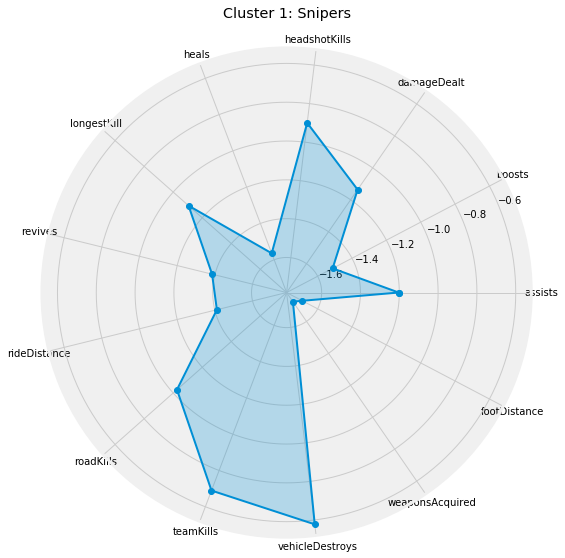

In [19]:
labels = np.array(cluster_data.columns.values)
labels = labels[:-1]
stats = radar_data.loc[0].values

angles=np.linspace(0, 2*np.pi, len(labels), endpoint=False)
# close the plot
stats=np.concatenate((stats,[stats[0]]))
angles=np.concatenate((angles,[angles[0]]))

#plot the figure
fig=plt.figure()
ax = fig.add_subplot(111, polar=True)
ax.plot(angles, stats, 'o-', linewidth=2)
ax.fill(angles, stats, alpha=0.25)
ax.set_thetagrids(angles * 180/np.pi, labels)
ax.set_title("Cluster 1: Snipers")
ax.grid(True)

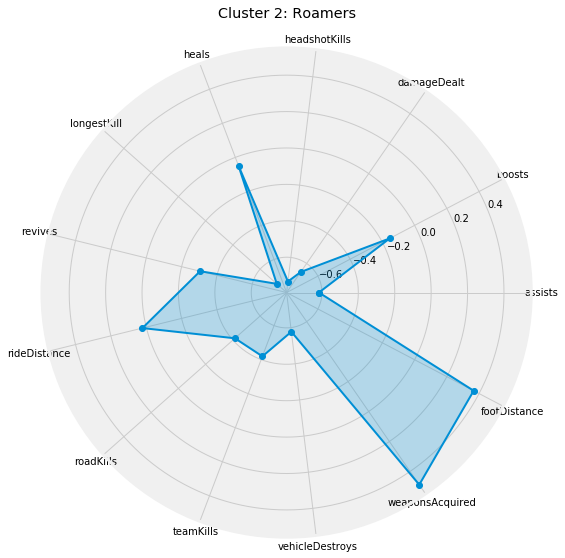

In [20]:
labels = np.array(cluster_data.columns.values)
labels = labels[:-1]
stats = radar_data.loc[1].values


angles=np.linspace(0, 2*np.pi, len(labels), endpoint=False)
# close the plot
stats=np.concatenate((stats,[stats[0]]))
angles=np.concatenate((angles,[angles[0]]))

#plot the figure
fig=plt.figure()
ax = fig.add_subplot(111, polar=True)
ax.plot(angles, stats, 'o-', linewidth=2)
ax.fill(angles, stats, alpha=0.25)
ax.set_thetagrids(angles * 180/np.pi, labels)
ax.set_title("Cluster 2: Roamers")
ax.grid(True)

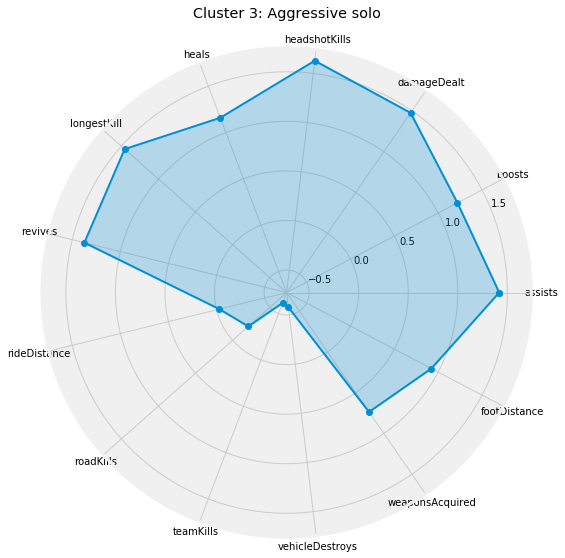

In [21]:
#https://www.kaggle.com/typewind/draw-a-radar-chart-with-python-in-a-simple-way
labels = np.array(cluster_data.columns.values)
labels = labels[:-1]
stats = radar_data.loc[2].values

angles=np.linspace(0, 2*np.pi, len(labels), endpoint=False)
# close the plot
stats=np.concatenate((stats,[stats[0]]))
angles=np.concatenate((angles,[angles[0]]))

#plot the figure
fig=plt.figure()
ax = fig.add_subplot(111, polar=True)
ax.plot(angles, stats, 'o-', linewidth=2)
ax.fill(angles, stats, alpha=0.25)
ax.set_thetagrids(angles * 180/np.pi, labels)
ax.set_title("Cluster 3: Aggressive solo")
ax.grid(True)

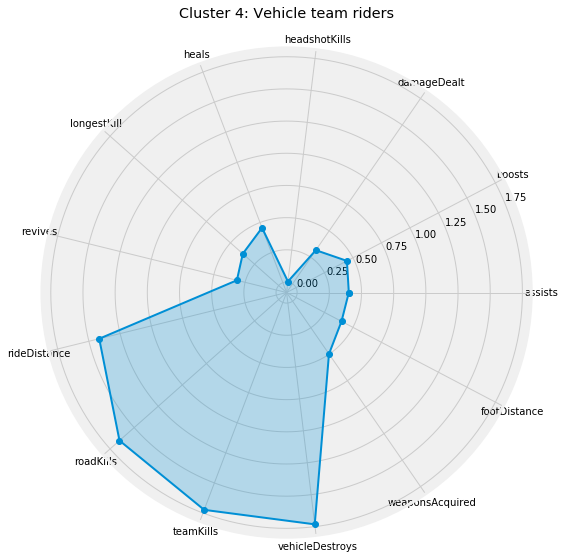

In [22]:
#https://www.kaggle.com/typewind/draw-a-radar-chart-with-python-in-a-simple-way
labels = np.array(cluster_data.columns.values)
labels = labels[:-1]
stats = radar_data.loc[3].values

angles=np.linspace(0, 2*np.pi, len(labels), endpoint=False)
# close the plot
stats=np.concatenate((stats,[stats[0]]))
angles=np.concatenate((angles,[angles[0]]))

#plot the figure
fig=plt.figure()
ax = fig.add_subplot(111, polar=True)
ax.plot(angles, stats, 'o-', linewidth=2)
ax.fill(angles, stats, alpha=0.25)
ax.set_thetagrids(angles * 180/np.pi, labels)
ax.set_title("Cluster 4: Vehicle team riders")
ax.grid(True)

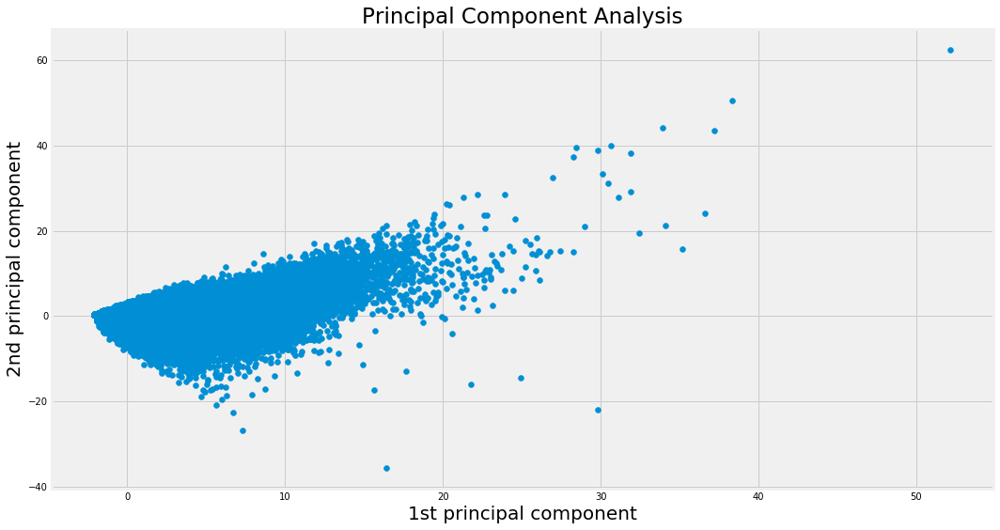

In [23]:
#we use the standardized cluster data and reduce to three dimensions 
pca = PCA(n_components=2)
pca_result = pca.fit_transform(st_cluster_data)

#https://github.com/llSourcell/spike_sorting
# Plot the 1st principal component aginst the 2nd and use the 3rd for color
fig, ax = plt.subplots(figsize=(16, 9)) 
ax.scatter(pca_result[:, 0], pca_result[:, 1])
ax.set_xlabel('1st principal component', fontsize=20)
ax.set_ylabel('2nd principal component', fontsize=20)
ax.set_title('Principal Component Analysis', fontsize=23)

fig.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

In [24]:
# Fitting K-Means to the dataset
num_clusters = 4
kmeans = KMeans(n_clusters=num_clusters,
                init='k-means++',
                max_iter=1000,
                n_init=20,
                random_state=30)
y_kmeans_pca = kmeans.fit_predict(pca_result)
y_kmeans_pca=y_kmeans_pca+1

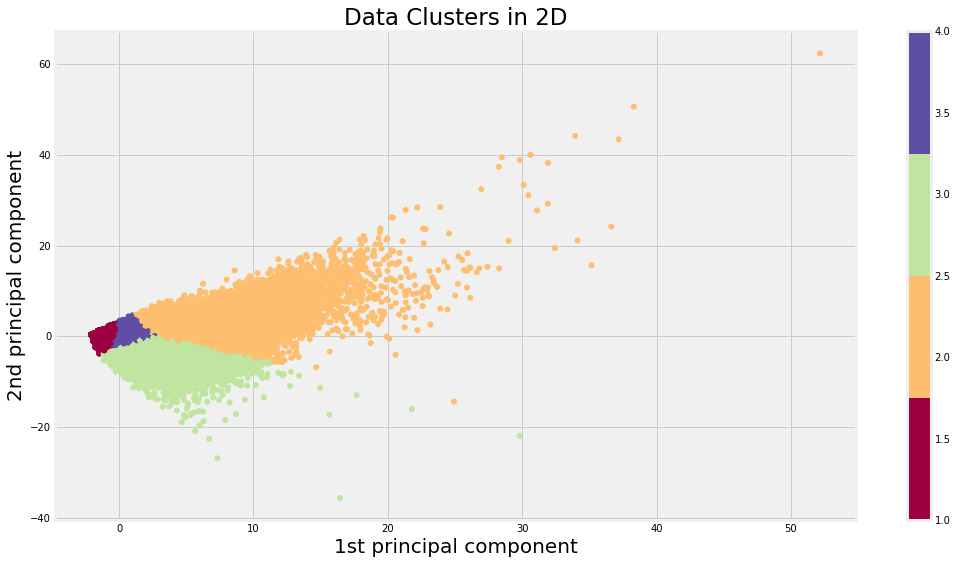

In [25]:
# Plot the result
plt.scatter(pca_result[:, 0], pca_result[:, 1],
           c=y_kmeans_pca, edgecolor='none', cmap=plt.get_cmap('Spectral',4))
plt.xlabel('1st principal component', fontsize=20)
plt.ylabel('2nd principal component', fontsize=20)
plt.title('Data Clusters in 2D', fontsize=23)
plt.colorbar();


### Now we are answering a few questions by performing Exploratory Data Analysis
### We will come up with various insights to will eventually answer our problem statement
### In order to do this we are trying to draw a pattern amongst the top rank players of the game.

In [26]:
import math 

import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 

from scipy.misc.pilutil import imread
%matplotlib inline 

In [27]:
df = pd.read_csv("/Users/prashasyasrivastava/Downloads/kill_match_stats_final_0.csv")

In [28]:
df.head()

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y
0,Grenade,KrazyPortuguese,5.0,657725.10,146275.2,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,823,KrazyPortuguese,5.0,657725.10,146275.2
1,SCAR-L,nide2Bxiaojiejie,31.0,93091.37,722236.4,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,194,X3evolution,33.0,92238.68,723375.1
2,S686,Ascholes,43.0,366921.40,421623.9,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,103,CtrlZee,46.0,367304.50,421216.1
3,Down and Out,Weirdo7777,9.0,472014.20,313274.8,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,1018,BlackDpre,13.0,476645.90,316758.4
4,M416,Solayuki1,9.0,473357.80,318340.5,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,1018,Vjolt,13.0,473588.50,318418.8


In [29]:
death_causes = df['killed_by'].value_counts()

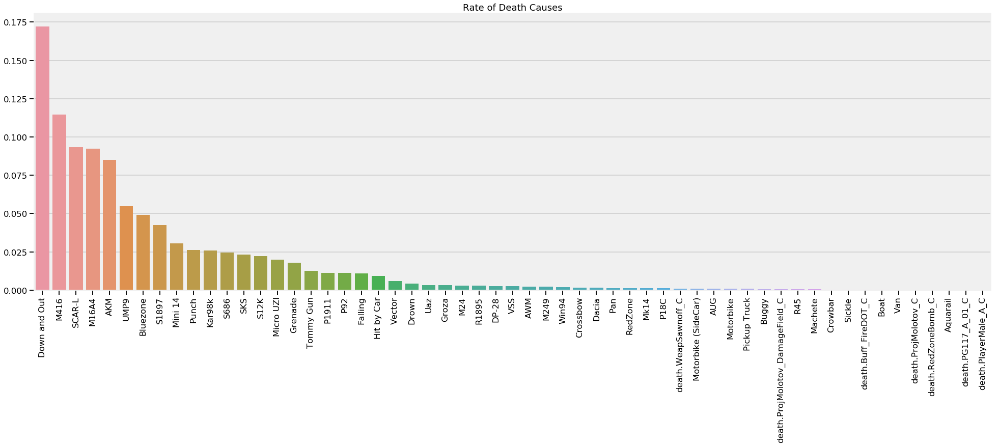

In [30]:
sns.set_context('talk')

fig = plt.figure(figsize=(30, 10))
ax = sns.barplot(x=death_causes.index, y=[v / sum(death_causes) for v in death_causes.values])
ax.set_title('Rate of Death Causes')
ax.set_xticklabels(death_causes.index, rotation=90);

In [31]:
df_er = df[df['map'] == 'ERANGEL']

In [32]:
len(df_er)

10865476

In [33]:
df_er.head()

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y
179,Down and Out,Malcolm_x,9.0,496989.8,312569.7,ERANGEL,2U4GBNA0YmnRe95wOy7kuweIkuZo5Roa0WjNZsgboi2gzz...,1035,Relugar,22.0,497385.4,331528.2
180,M16A4,Malcolm_x,9.0,496989.8,312569.7,ERANGEL,2U4GBNA0YmnRe95wOy7kuweIkuZo5Roa0WjNZsgboi2gzz...,1035,LiPoBattery,22.0,497819.4,331981.3
181,AKM,G_Berg,7.0,460416.7,414748.8,ERANGEL,2U4GBNA0YmnRe95wOy7kuweIkuZo5Roa0WjNZsgboi2gzz...,1422,cornsour,16.0,459817.9,414426.3
182,AKM,Lukesnake17,20.0,488034.1,347220.3,ERANGEL,2U4GBNA0YmnRe95wOy7kuweIkuZo5Roa0WjNZsgboi2gzz...,1210,Homebrw,9.0,487444.2,347651.0
183,SKS,AlooGobi,2.0,501062.9,425078.6,ERANGEL,2U4GBNA0YmnRe95wOy7kuweIkuZo5Roa0WjNZsgboi2gzz...,1818,Powfa,3.0,493043.4,434458.1


In [34]:
df_mr = df[df['map'] == 'MIRAMAR']

In [35]:
len(df_mr)

2398143

In [36]:
df_mr.head()

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y
0,Grenade,KrazyPortuguese,5.0,657725.10,146275.2,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,823,KrazyPortuguese,5.0,657725.10,146275.2
1,SCAR-L,nide2Bxiaojiejie,31.0,93091.37,722236.4,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,194,X3evolution,33.0,92238.68,723375.1
2,S686,Ascholes,43.0,366921.40,421623.9,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,103,CtrlZee,46.0,367304.50,421216.1
3,Down and Out,Weirdo7777,9.0,472014.20,313274.8,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,1018,BlackDpre,13.0,476645.90,316758.4
4,M416,Solayuki1,9.0,473357.80,318340.5,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,1018,Vjolt,13.0,473588.50,318418.8


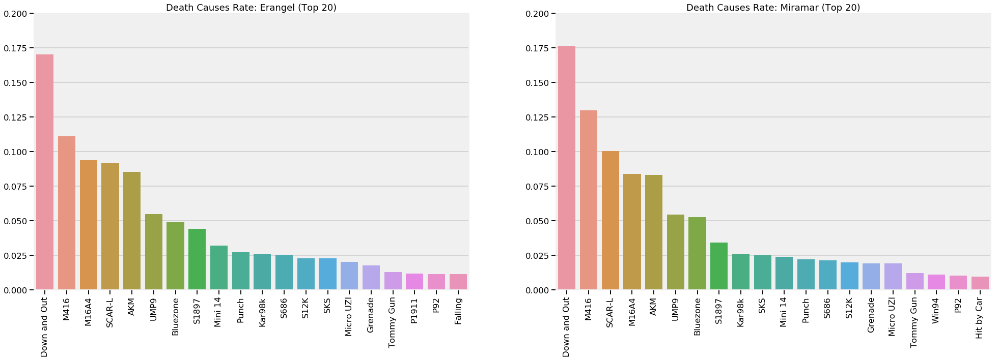

In [37]:
rank = 20

f, axes = plt.subplots(1, 2, figsize=(30, 10))
axes[0].set_title('Death Causes Rate: Erangel (Top {})'.format(rank))
axes[1].set_title('Death Causes Rate: Miramar (Top {})'.format(rank))

counts_er = df_er['killed_by'].value_counts()
counts_mr = df_mr['killed_by'].value_counts()

sns.barplot(x=counts_er[:rank].index, y=[v / sum(counts_er) for v in counts_er.values][:rank], ax=axes[0] )
sns.barplot(x=counts_mr[:rank].index, y=[v / sum(counts_mr) for v in counts_mr.values][:rank], ax=axes[1] )
axes[0].set_ylim((0, 0.20))
axes[0].set_xticklabels(counts_er.index, rotation=90)
axes[1].set_ylim((0, 0.20))
axes[1].set_xticklabels(counts_mr.index, rotation=90);

### These are the top 10 Death causes for both the Arenas.

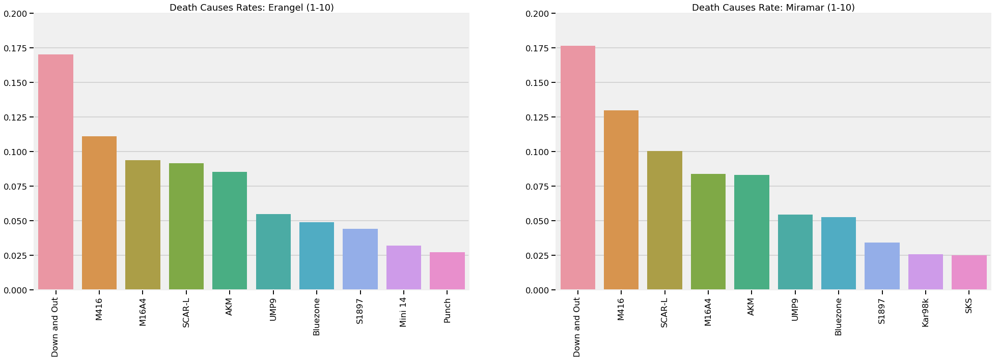

In [38]:
f, axes = plt.subplots(1, 2, figsize=(30, 10))
axes[0].set_title('Death Causes Rates: Erangel (1-{})'.format(rank//2))
axes[1].set_title('Death Causes Rate: Miramar (1-{})'.format(rank//2))


sns.barplot(x=counts_er[:rank//2].index, y=[v / sum(counts_er) for v in counts_er.values][:rank//2], ax=axes[0])
sns.barplot(x=counts_mr[:rank//2].index, y=[v / sum(counts_mr) for v in counts_mr.values][:rank//2], ax=axes[1])
axes[0].set_ylim((0, 0.20))
axes[0].set_xticklabels(counts_er[:rank//2].index, rotation=90)
axes[1].set_ylim((0, 0.20))
axes[1].set_xticklabels(counts_mr[:rank//2].index, rotation=90);

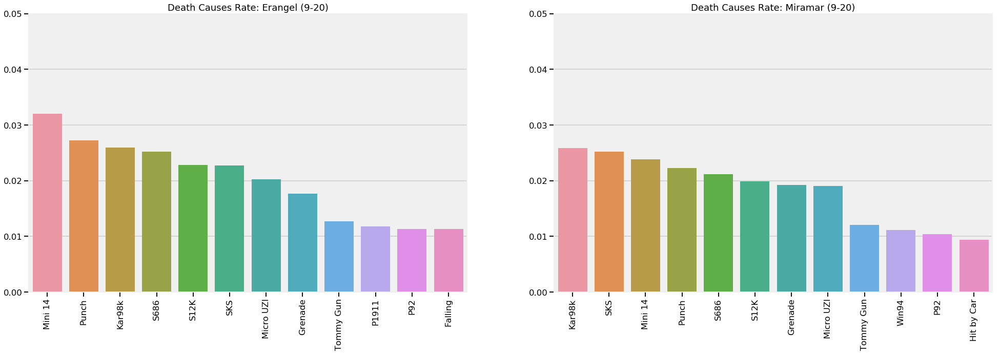

In [39]:
f, axes = plt.subplots(1, 2, figsize=(30, 10))
axes[0].set_title('Death Causes Rate: Erangel (9-{})'.format(rank))
axes[1].set_title('Death Causes Rate: Miramar (9-{})'.format(rank))

sns.barplot(x=counts_er[8:rank].index, y=[v / sum(counts_er) for v in counts_er.values][8:rank], ax=axes[0] )
sns.barplot(x=counts_mr[8:rank].index, y=[v / sum(counts_mr) for v in counts_mr.values][8:rank], ax=axes[1] )
axes[0].set_ylim((0, 0.05))
axes[0].set_xticklabels(counts_er[8:rank].index, rotation=90)
axes[1].set_ylim((0, 0.05))
axes[1].set_xticklabels(counts_mr[8:rank].index, rotation=90);

In [40]:
import math

def get_dist(df):
    dist = []

    for row in df.itertuples():
        subset = (row.killer_position_x - row.victim_position_x)**2 + (row.killer_position_y - row.victim_position_y)**2
        if subset > 0:
            dist.append(math.sqrt(subset) / 100)
        else:
            dist.append(0)
    return dist

In [41]:
df_dist = pd.DataFrame.from_dict({'dist(m)': get_dist(df_er)})
df_dist.index = df_er.index

df_er_dist = pd.concat([
    df_er,
    df_dist
], axis=1, sort=True)

df_er_dist.head()

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y,dist(m)
179,Down and Out,Malcolm_x,9.0,496989.8,312569.7,ERANGEL,2U4GBNA0YmnRe95wOy7kuweIkuZo5Roa0WjNZsgboi2gzz...,1035,Relugar,22.0,497385.4,331528.2,189.626270
180,M16A4,Malcolm_x,9.0,496989.8,312569.7,ERANGEL,2U4GBNA0YmnRe95wOy7kuweIkuZo5Roa0WjNZsgboi2gzz...,1035,LiPoBattery,22.0,497819.4,331981.3,194.293194
181,AKM,G_Berg,7.0,460416.7,414748.8,ERANGEL,2U4GBNA0YmnRe95wOy7kuweIkuZo5Roa0WjNZsgboi2gzz...,1422,cornsour,16.0,459817.9,414426.3,6.801233
182,AKM,Lukesnake17,20.0,488034.1,347220.3,ERANGEL,2U4GBNA0YmnRe95wOy7kuweIkuZo5Roa0WjNZsgboi2gzz...,1210,Homebrw,9.0,487444.2,347651.0,7.304002
183,SKS,AlooGobi,2.0,501062.9,425078.6,ERANGEL,2U4GBNA0YmnRe95wOy7kuweIkuZo5Roa0WjNZsgboi2gzz...,1818,Powfa,3.0,493043.4,434458.1,123.404781


In [42]:
df_er_dist[df_er_dist['dist(m)'] == max(df_er_dist['dist(m)'])]

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y,dist(m)
4920300,Punch,DatVux,19.0,690188.3,781142.9,ERANGEL,2U4GBNA0YmmkZ3zoIAt9lAN0mdlqGYG8sKs0La_QjbGAgQ...,460,JIO_Freed,19.0,0.0,0.0,10423.742704


In [43]:
df_dist = pd.DataFrame.from_dict({'dist(m)': get_dist(df_mr)})
df_dist.index = df_mr.index

df_mr_dist = pd.concat([
    df_mr,
    df_dist
], axis=1, sort=True)

df_mr_dist.head()

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y,dist(m)
0,Grenade,KrazyPortuguese,5.0,657725.10,146275.2,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,823,KrazyPortuguese,5.0,657725.10,146275.2,0.000000
1,SCAR-L,nide2Bxiaojiejie,31.0,93091.37,722236.4,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,194,X3evolution,33.0,92238.68,723375.1,14.225744
2,S686,Ascholes,43.0,366921.40,421623.9,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,103,CtrlZee,46.0,367304.50,421216.1,5.595234
3,Down and Out,Weirdo7777,9.0,472014.20,313274.8,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,1018,BlackDpre,13.0,476645.90,316758.4,57.955253
4,M416,Solayuki1,9.0,473357.80,318340.5,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,1018,Vjolt,13.0,473588.50,318418.8,2.436255


In [44]:
df_mr_dist[df_mr_dist['dist(m)'] == max(df_mr_dist['dist(m)'])]

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y,dist(m)
10866714,Falling,Hao514514,3.0,722266.3,592270.4,MIRAMAR,2U4GBNA0YmllNMmtbEluZT07BlDuXWi3J3_ixrh89XQIlL...,421,Direction-,10.0,0.0,0.0,9340.518373


In [45]:
df_er_dist['dist(m)'].describe()

count    1.086548e+07
mean     1.908772e+02
std      9.672825e+02
min      0.000000e+00
25%      3.774898e+00
50%      1.418120e+01
75%      5.262052e+01
max      1.042374e+04
Name: dist(m), dtype: float64

In [46]:
df_mr_dist['dist(m)'].describe()

count    2.398143e+06
mean     1.776657e+02
std      9.227465e+02
min      0.000000e+00
25%      3.771908e+00
50%      1.369747e+01
75%      4.557855e+01
max      9.340518e+03
Name: dist(m), dtype: float64

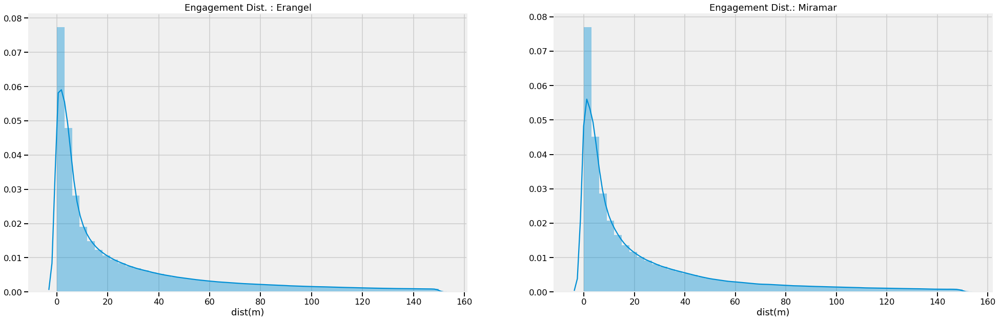

In [47]:
f, axes = plt.subplots(1, 2, figsize=(30, 10))

plot_dist = 150

axes[0].set_title('Engagement Dist. : Erangel')
axes[1].set_title('Engagement Dist.: Miramar')

plot_dist_er = df_er_dist[df_er_dist['dist(m)'] <= plot_dist]
plot_dist_mr = df_mr_dist[df_mr_dist['dist(m)'] <= plot_dist]

sns.distplot(plot_dist_er['dist(m)'], ax=axes[0])
sns.distplot(plot_dist_mr['dist(m)'], ax=axes[1]);

In [48]:
# Erangel image size = 4096
# Miramar image size = 1000
position = ['killer_position_x', 'killer_position_y', 'victim_position_x', 'victim_position_y']

for pos in position:
    df_er_dist[pos] = df_er_dist[pos]*4096/800000
    df_mr_dist[pos] = df_mr_dist[pos]*1000/800000

In [49]:
df_er_dist.head()

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y,dist(m)
179,Down and Out,Malcolm_x,9.0,2544.587776,1600.356864,ERANGEL,2U4GBNA0YmnRe95wOy7kuweIkuZo5Roa0WjNZsgboi2gzz...,1035,Relugar,22.0,2546.613248,1697.424384,189.626270
180,M16A4,Malcolm_x,9.0,2544.587776,1600.356864,ERANGEL,2U4GBNA0YmnRe95wOy7kuweIkuZo5Roa0WjNZsgboi2gzz...,1035,LiPoBattery,22.0,2548.835328,1699.744256,194.293194
181,AKM,G_Berg,7.0,2357.333504,2123.513856,ERANGEL,2U4GBNA0YmnRe95wOy7kuweIkuZo5Roa0WjNZsgboi2gzz...,1422,cornsour,16.0,2354.267648,2121.862656,6.801233
182,AKM,Lukesnake17,20.0,2498.734592,1777.767936,ERANGEL,2U4GBNA0YmnRe95wOy7kuweIkuZo5Roa0WjNZsgboi2gzz...,1210,Homebrw,9.0,2495.714304,1779.973120,7.304002
183,SKS,AlooGobi,2.0,2565.442048,2176.402432,ERANGEL,2U4GBNA0YmnRe95wOy7kuweIkuZo5Roa0WjNZsgboi2gzz...,1818,Powfa,3.0,2524.382208,2224.425472,123.404781


In [50]:
df_mr_dist.head()

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y,dist(m)
0,Grenade,KrazyPortuguese,5.0,822.156375,182.844000,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,823,KrazyPortuguese,5.0,822.156375,182.844000,0.000000
1,SCAR-L,nide2Bxiaojiejie,31.0,116.364212,902.795500,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,194,X3evolution,33.0,115.298350,904.218875,14.225744
2,S686,Ascholes,43.0,458.651750,527.029875,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,103,CtrlZee,46.0,459.130625,526.520125,5.595234
3,Down and Out,Weirdo7777,9.0,590.017750,391.593500,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,1018,BlackDpre,13.0,595.807375,395.948000,57.955253
4,M416,Solayuki1,9.0,591.697250,397.925625,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,1018,Vjolt,13.0,591.985625,398.023500,2.436255


In [51]:
match_id = df_er_dist['match_id'].unique()[0]
df_match = df_er_dist[df_er_dist['match_id'] ==  match_id]
df_match['time'].describe()

count      98.000000
mean      822.163265
std       614.508415
min        82.000000
25%       221.000000
50%       720.000000
75%      1421.750000
max      1885.000000
Name: time, dtype: float64

In [55]:
def plot_engagement_pos(df_match):
    f, axes = plt.subplots(1, 3, figsize=(30, 30))
    bg = imread("/Users/prashasyasrivastava/Downloads/erangel.jpg")

    time_25 = df_match['time'].describe()['25%']
    time_50 = df_match['time'].describe()['50%']
    time_75 = df_match['time'].describe()['75%']
    time_max = df_match['time'].describe()['max']

    axes[0].imshow(bg)
    axes[0].set_title('Engagement Position: Erangle (0s - 720s)')
    df_match_1 = df_match[df_match['time'] <= time_25]
    x = df_match_1['killer_position_x'].values
    y = df_match_1['killer_position_y'].values
    u = df_match_1['victim_position_x'].values
    v = df_match_1['victim_position_y'].values
    axes[0].quiver(x, y, u, v, angles='xy', scale_units='xy', scale=25, color='green')

    axes[1].imshow(bg)
    axes[1].set_title('Engagement Position: Erangle (720s - 1421s)')
    df_match_2 = df_match[(df_match['time'] >=  time_25) & (df_match['time'] <= time_50)]
    x = df_match_2['killer_position_x'].values
    y = df_match_2['killer_position_y'].values
    u = df_match_2['victim_position_x'].values
    v = df_match_2['victim_position_y'].values
    axes[1].quiver(x, y, u, v, angles='xy', scale_units='xy', scale=25, color='green');

    axes[2].imshow(bg)
    axes[2].set_title('Engagement Position: Erangle (1421s - 1885s)')
    df_match_2 = df_match[(df_match['time'] >= time_50) & (df_match['time'] <= time_max)]
    x = df_match_2['killer_position_x'].values
    y = df_match_2['killer_position_y'].values
    u = df_match_2['victim_position_x'].values
    v = df_match_2['victim_position_y'].values
    axes[2].quiver(x, y, u, v, angles='xy', scale_units='xy', scale=25, color='green');

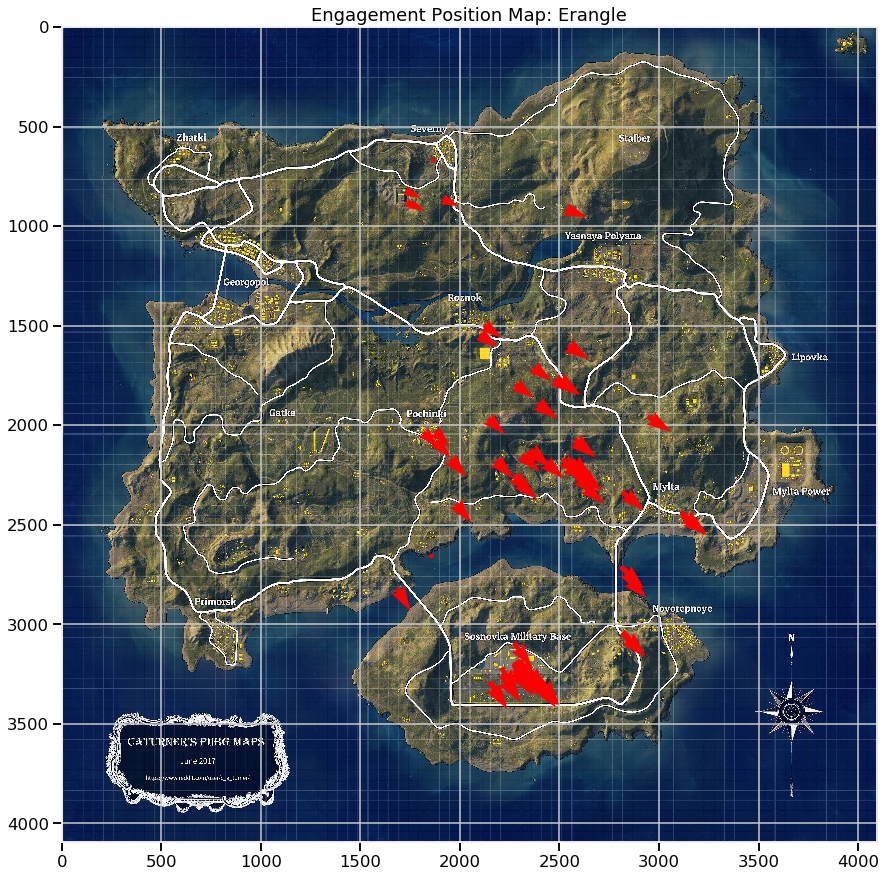

In [56]:
x =df_match['killer_position_x'].values
y = df_match['killer_position_y'].values

u = df_match['victim_position_x'].values
v = df_match['victim_position_y'].values

bg = imread("/Users/prashasyasrivastava/Downloads/erangel.jpg")
fig, ax = plt.subplots(1, 1, figsize=(15,15))
ax.imshow(bg)
ax.set_title('Engagement Position Map: Erangle')
plt.quiver(x, y, u, v, angles='xy', scale_units='xy', scale=25, color='red');

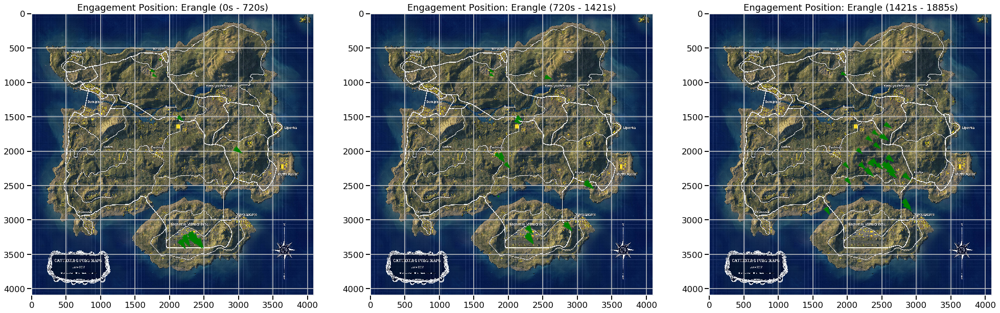

In [57]:
plot_engagement_pos(df_match)

In [58]:
match_id = df_er_dist['match_id'].unique()[1]
df_match = df_er_dist[df_er_dist['match_id'] ==  match_id]
df_match['time'].describe()

count      92.000000
mean      757.163043
std       581.724932
min        98.000000
25%       256.750000
50%       479.000000
75%      1396.500000
max      1854.000000
Name: time, dtype: float64

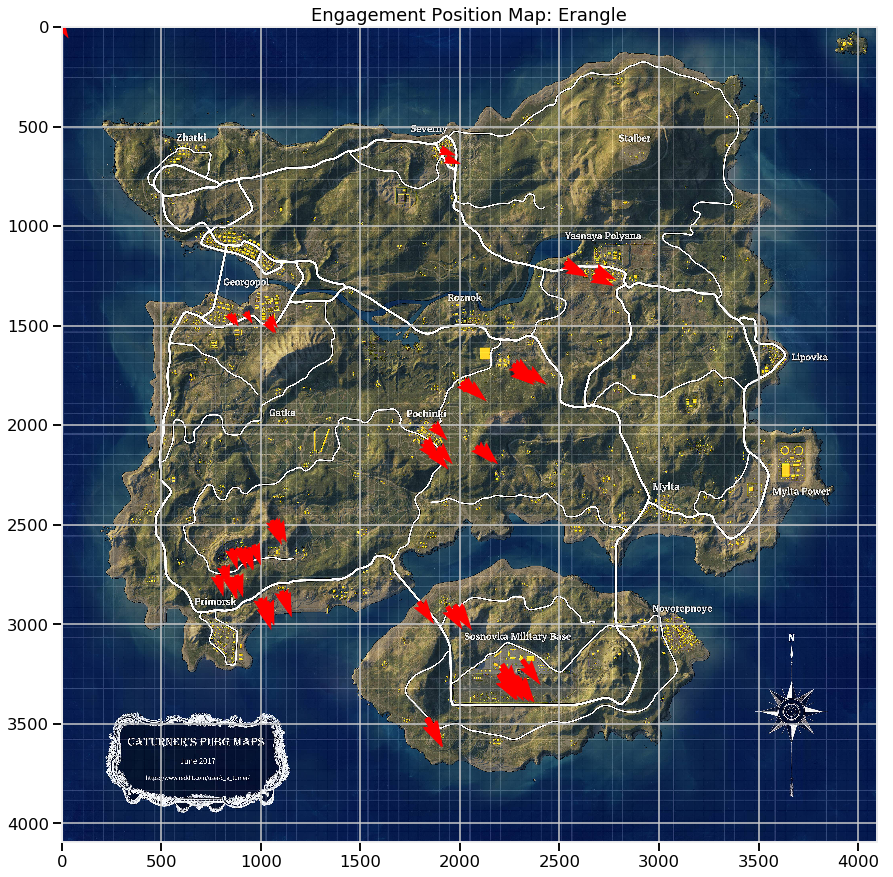

In [59]:
x =df_match['killer_position_x'].values
y = df_match['killer_position_y'].values

u = df_match['victim_position_x'].values
v = df_match['victim_position_y'].values

bg = imread("/Users/prashasyasrivastava/Downloads/erangel.jpg")
fig, ax = plt.subplots(1, 1, figsize=(15,15))
ax.imshow(bg)
ax.set_title('Engagement Position Map: Erangle')
plt.quiver(x, y, u, v, angles='xy', scale_units='xy', scale=25, color='red');

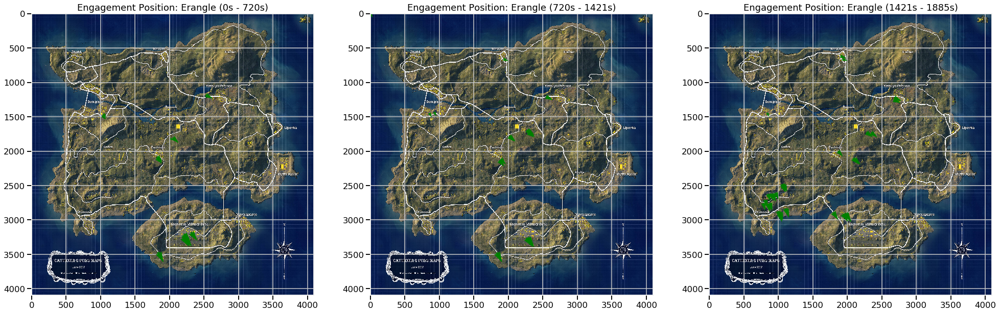

In [60]:
plot_engagement_pos(df_match)

In [61]:
import math 

import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 

from scipy.misc.pilutil import imread
%matplotlib inline 

sample = pd.read_csv("/Users/prashasyasrivastava/Downloads/kill_match_stats_final_0.csv")

In [62]:
sample.shape

(13426348, 12)

In [63]:
# small = sample.loc[(sample['map'] == 'MIRAMAR') & (sample['killer_position_x'] != 0)
#                   & (sample['victim_position_x'] != 0)][:10000].copy()
small = sample.loc[(sample['map'] == 'MIRAMAR')][:10000].copy()

x_diffs = small['killer_position_x'] - small['victim_position_x']
y_diffs = small['killer_position_y'] - small['victim_position_y']
sq_diffs = x_diffs ** 2 + y_diffs ** 2
dists = np.sqrt(sq_diffs)
log_dists = np.log10(1 + dists)
small.head()

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y
0,Grenade,KrazyPortuguese,5.0,657725.10,146275.2,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,823,KrazyPortuguese,5.0,657725.10,146275.2
1,SCAR-L,nide2Bxiaojiejie,31.0,93091.37,722236.4,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,194,X3evolution,33.0,92238.68,723375.1
2,S686,Ascholes,43.0,366921.40,421623.9,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,103,CtrlZee,46.0,367304.50,421216.1
3,Down and Out,Weirdo7777,9.0,472014.20,313274.8,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,1018,BlackDpre,13.0,476645.90,316758.4
4,M416,Solayuki1,9.0,473357.80,318340.5,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,1018,Vjolt,13.0,473588.50,318418.8


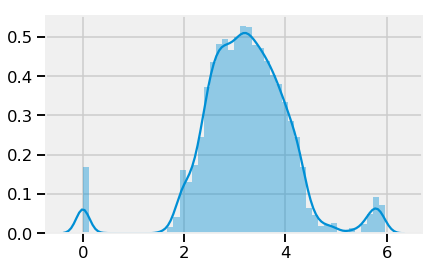

In [64]:
sns.distplot(log_dists.dropna());

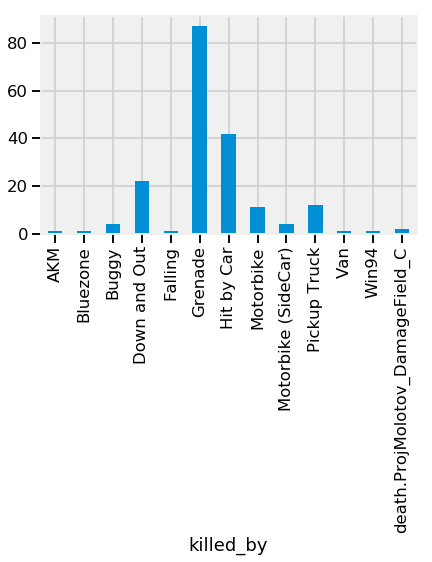

In [65]:
small.loc[log_dists < 1, :].groupby('killed_by').size().plot.bar();

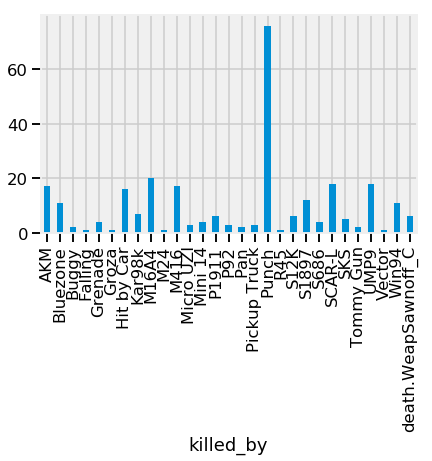

In [66]:
small.loc[log_dists > 5, :].groupby('killed_by').size().plot.bar();

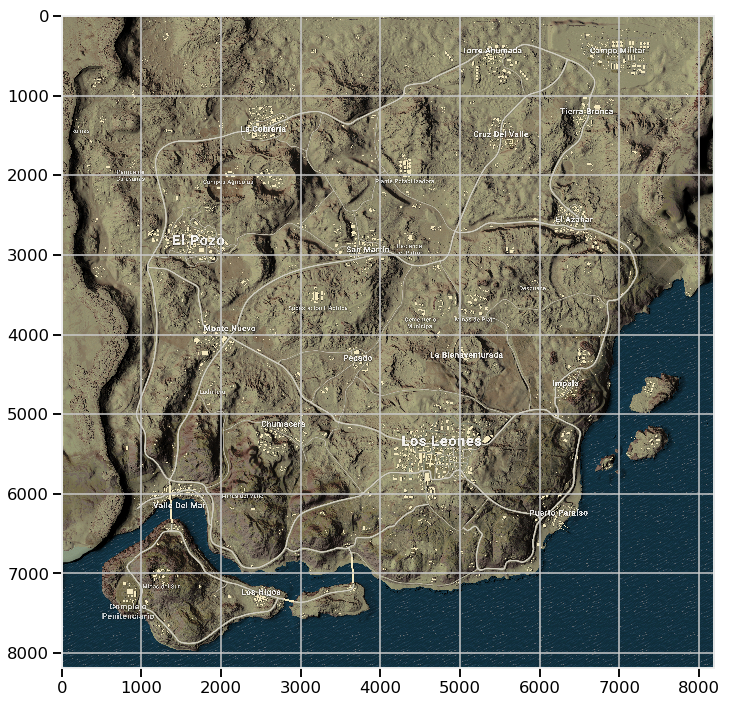

In [67]:
bg = imread("/Users/prashasyasrivastava/Downloads/miramar-large.png")
fig, ax = plt.subplots(figsize=(12, 12))
ax.imshow(bg);

In [68]:
def kill_viz(killer_pos, victim_pos, bg, bg_width, bg_height, zoom=False, figsize=(15, 15)):
    fig, ax = plt.subplots(figsize=figsize)
    x, y = killer_pos
    tx, ty = victim_pos
    dx, dy = tx - x, ty - y
    x *= bg_width / 800000
    y *= bg_height / 800000
    dx *= bg_width / 800000
    dy *= bg_height / 800000
    ax.imshow(bg)
    arrow_width = min((abs(dx) + abs(dy)), (bg_width + bg_height) * 0.2) * 0.02
    if zoom:
        edge = max(abs(dx), abs(dy))
        ax.set_xlim(max(0, min(x, x + dx) - edge * 5), min(max(x, x + dx) + edge * 5, bg_width))
        ax.set_ylim(min(max(y, y + dy) + edge * 5, bg_width), max(min(y, y + dy) - edge * 5, 0))
    ax.arrow(x, y, dx, dy, width=arrow_width, color='r', length_includes_head=True)
    plt.show()

In [69]:
temp = small.loc[(log_dists > 5)].iloc[0]
kp = (temp['killer_position_x'], temp['killer_position_y'])
vp = (temp['victim_position_x'], temp['victim_position_y'])
print(temp)

killed_by                                                        Punch
killer_name                                              xuezhiqian717
killer_placement                                                    26
killer_position_x                                               721944
killer_position_y                                               359575
map                                                            MIRAMAR
match_id             2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...
time                                                               123
victim_name                                             PurplePenguin9
victim_placement                                                    47
victim_position_x                                                    0
victim_position_y                                                    0
Name: 5, dtype: object


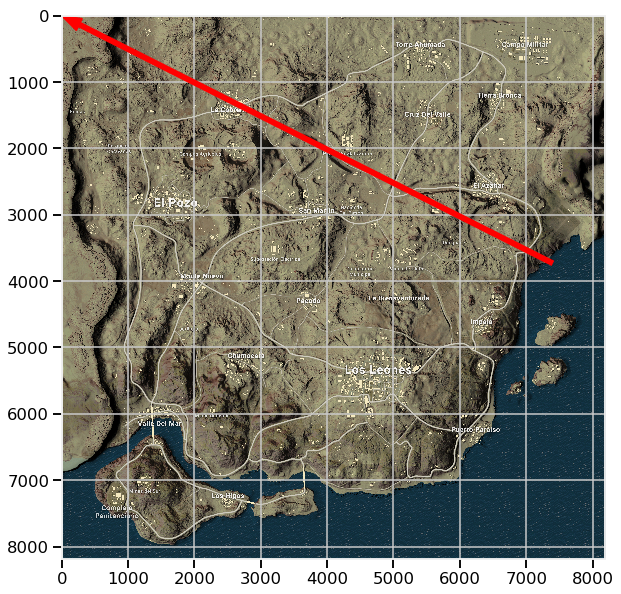

In [70]:
kill_viz(kp, vp, bg, 8192, 8292, zoom=True, figsize=(10, 10))

In [71]:
temp = small.loc[(log_dists > 5)].iloc[50]
kp = (temp['killer_position_x'], temp['killer_position_y'])
vp = (temp['victim_position_x'], temp['victim_position_y'])
print(temp)

killed_by                                                        Punch
killer_name                                               FZQ274978796
killer_placement                                                    12
killer_position_x                                               128098
killer_position_y                                               638211
map                                                            MIRAMAR
match_id             2U4GBNA0YmmkW482XMScV-8O0B-j_sTdLF9lGQIhdOhEUA...
time                                                               215
victim_name                                                  Dog-GouZi
victim_placement                                                    11
victim_position_x                                                    0
victim_position_y                                                    0
Name: 11004, dtype: object


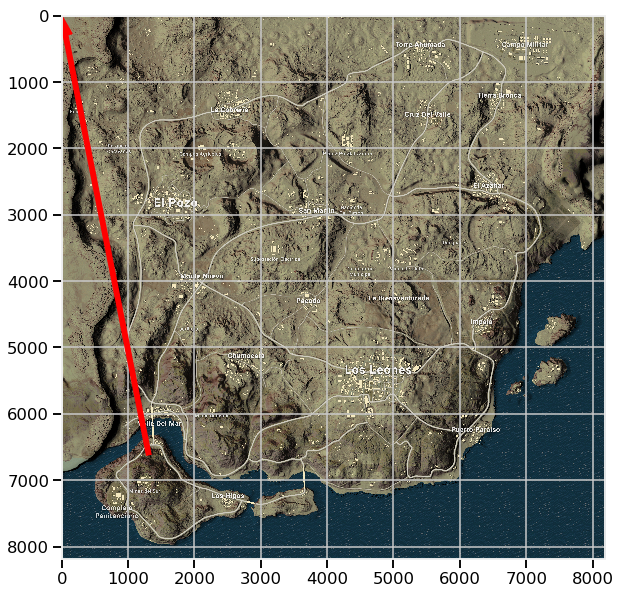

In [72]:
kill_viz(kp, vp, bg, 8192, 8292, zoom=True, figsize=(10, 10))

In [73]:
temp = small[small['killer_position_x'] == 0].loc[(log_dists > 5)].iloc[0]
kp = (temp['killer_position_x'], temp['killer_position_y'])
vp = (temp['victim_position_x'], temp['victim_position_y'])
print(temp)

killed_by                                                      Grenade
killer_name                                                   #unknown
killer_placement                                                     3
killer_position_x                                                    0
killer_position_y                                                    0
map                                                            MIRAMAR
match_id             2U4GBNA0Yml3HEnAb5HSfMbBgZnnKeFS1Nyxgm5XowlAkE...
time                                                              1198
victim_name                                                   #unknown
victim_placement                                                     3
victim_position_x                                               510431
victim_position_y                                               426255
Name: 155, dtype: object


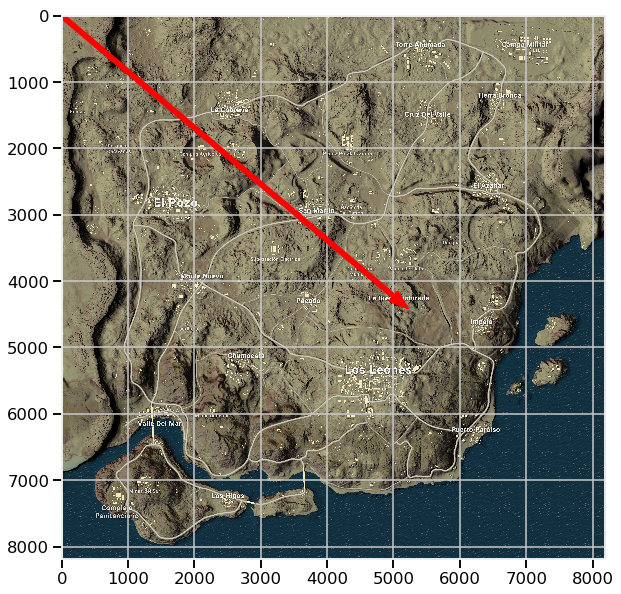

In [74]:
kill_viz(kp, vp, bg, 8192, 8292, zoom=True, figsize=(10, 10))

In [75]:
small = sample.loc[(sample['map'] == 'MIRAMAR') & (sample['killer_position_x'] != 0)
                  & (sample['victim_position_x'] != 0)][:10000].copy()

x_diffs = small['killer_position_x'] - small['victim_position_x']
y_diffs = small['killer_position_y'] - small['victim_position_y']
sq_diffs = x_diffs ** 2 + y_diffs ** 2
dists = np.sqrt(sq_diffs)
log_dists = np.log10(1 + dists)
small['log_dist'] = log_dists

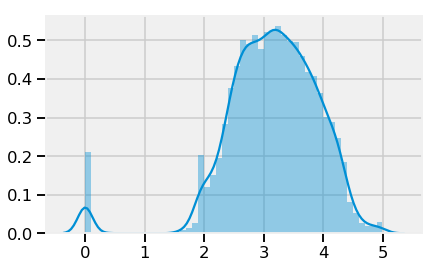

In [76]:
sns.distplot(log_dists.dropna());

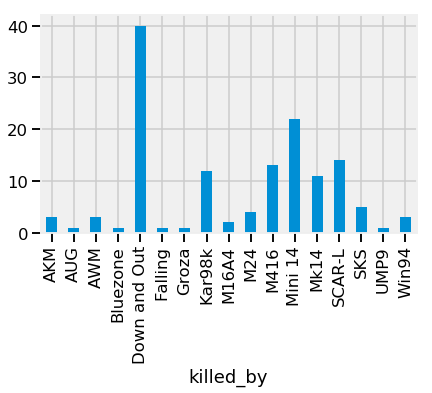

In [77]:
small.loc[log_dists > 4.5, :].groupby('killed_by').size().plot.bar();

In [78]:
temp = small.loc[(log_dists == np.max(log_dists))].iloc[0]
kp = (temp['killer_position_x'], temp['killer_position_y'])
vp = (temp['victim_position_x'], temp['victim_position_y'])
print(temp)

killed_by                                                      Mini 14
killer_name                                                  651651646
killer_placement                                                     1
killer_position_x                                               439048
killer_position_y                                               277052
map                                                            MIRAMAR
match_id             2U4GBNA0Yml3HEnAb5HSfMbBgZnnKeFS1Nyxgm5XowlAkE...
time                                                               458
victim_name                                               nainaigeshao
victim_placement                                                    13
victim_position_x                                               537676
victim_position_y                                               265804
log_dist                                                       4.99681
Name: 157, dtype: object


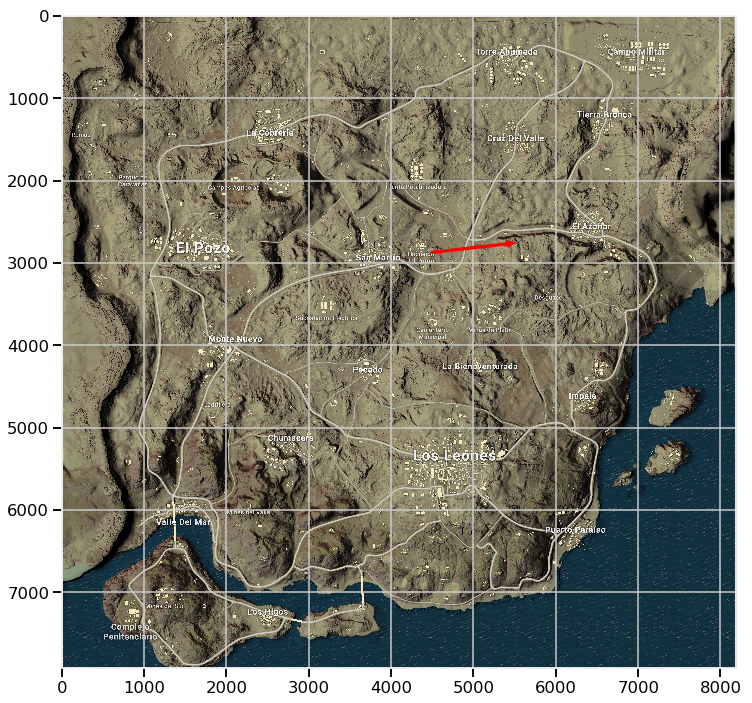

In [79]:
kill_viz(kp, vp, bg, 8192, 8292, zoom=True, figsize=(12, 12))

In [80]:
top_weapons = list(small[small['killed_by'] != 'Down and Out'].groupby('killed_by').size()\
                     .sort_values(ascending=False)[:10].index)
top_weapon_kills = small[np.in1d(small['killed_by'], top_weapons)].copy()
top_weapon_kills['bin'] = pd.cut(top_weapon_kills['log_dist'], np.arange(0, 6.2, 0.2), include_lowest=True, labels=False)
top_weapon_kills_wide = top_weapon_kills.groupby(['killed_by', 'bin']).size().unstack(fill_value=0).transpose()

In [81]:
from bokeh.models import HoverTool
import bokeh.plotting as bplt

In [82]:
def  stacked(df):
    df_top = df.cumsum(axis=1)
    df_bottom = df_top.shift(axis=1).fillna(0)[::-1]
    df_stack = pd.concat([df_bottom, df_top], ignore_index=True)
    return df_stack

hover = HoverTool(
    tooltips=[
            ("index", "$index"),
            ("weapon", "@weapon"),
            ("(x,y)", "($x, $y)")
        ],
    point_policy='follow_mouse'
    )

areas = stacked(top_weapon_kills_wide)



In [83]:
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource
from bokeh.plotting import figure, show, output_file, output_notebook
from bokeh.palettes import brewer
from bokeh.models.tools import HoverTool
from bokeh.models.sources import ColumnDataSource

from collections import Counter

In [84]:
colors = brewer['Spectral'][areas.shape[1]]
x2 = np.hstack((top_weapon_kills_wide.index[::-1],
                top_weapon_kills_wide.index)) / 5

TOOLS="pan,wheel_zoom,box_zoom,reset,previewsave"
output_notebook()
p = figure(x_range=(1, 5), y_range=(0, 800), tools=[TOOLS, hover], plot_width=800)
p.grid.minor_grid_line_color = '#eeeeee'

source = ColumnDataSource(data={
    'x': [x2] * areas.shape[1],
    'y': [areas[c].values for c in areas],
    'weapon': list(top_weapon_kills_wide.columns),
    'color': colors
   
})

p.patches('x', 'y', source=source, legend="weapon",
           color='color', alpha=0.8, line_color=None)

p.title.text = "Distribution of Kill Distance per Weapon"
p.xaxis.axis_label = "log10 of kill distance"
p.yaxis.axis_label = "number of kills"
show(p)

Loading BokehJS ...

In [85]:
!pip install palettable

    100% |████████████████████████████████| 81kB 581kB/s ta 0:00:01


## Linear Regression

- Our target variable WinPlacePerc is continuous in nature because its values range from 0 to 1. Amongst the 29 variables in our dataset 25 variables are numeric in nature.
- Hence we thought Linear regression is perfect to predict the value of our target variable.

In [86]:
#To start with, we will importing a few packages:
import numpy as np 
import pandas as pd 

import os


In [99]:
conda install py-xgboost

Solving environment: done

## Package Plan ##

  environment location: /Users/prashasyasrivastava/anaconda3

  added / updated specs:
    - py-xgboost


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    _py-xgboost-mutex-2.0      |            cpu_0           8 KB
    libxgboost-0.80            |       h0a44026_0         2.1 MB
    llvm-openmp-4.0.1          |       hcfea43d_1         454 KB
    openssl-1.1.1b             |       h1de35cc_1         3.4 MB
    py-xgboost-0.80            |   py37h0a44026_0         1.1 MB
    ------------------------------------------------------------
                                           Total:         7.1 MB

The following NEW packages will be INSTALLED:

  _py-xgboost-mutex  pkgs/main/osx-64::_py-xgboost-mutex-2.0-cpu_0
  libxgboost         pkgs/main/osx-64::libxgboost-0.80-h0a44026_0
  llvm-openmp        pkgs/main/osx-64::llvm-openmp-4.0.1-hcfea43d_1

In [101]:
%matplotlib inline
# import pandas as pd
# import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
from IPython.core.pylabtools import figsize

from xgboost import XGBClassifier

from sklearn.model_selection import train_test_split
from sklearn.ensemble import ExtraTreesClassifier
from sklearn import svm
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score

In [102]:
#We will now import the data. We have already divided the data in training and testing dataset.
#First we are importing the training dataset.
data = pd.read_csv("/Users/prashasyasrivastava/Downloads/train.csv")

In [103]:
#Let us see a few records from the dataset for ou reference.
data.head()

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,...,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
0,7f96b2f878858a,4d4b580de459be,a10357fd1a4a91,0,0,0.00,0,0,0,60,...,0,0.0000,0,0.00,0,0,244.80,1,1466,0.4444
1,eef90569b9d03c,684d5656442f9e,aeb375fc57110c,0,0,91.47,0,0,0,57,...,0,0.0045,0,11.04,0,0,1434.00,5,0,0.6400
2,1eaf90ac73de72,6a4a42c3245a74,110163d8bb94ae,1,0,68.00,0,0,0,47,...,0,0.0000,0,0.00,0,0,161.80,2,0,0.7755
3,4616d365dd2853,a930a9c79cd721,f1f1f4ef412d7e,0,0,32.90,0,0,0,75,...,0,0.0000,0,0.00,0,0,202.70,3,0,0.1667
4,315c96c26c9aac,de04010b3458dd,6dc8ff871e21e6,0,0,100.00,0,0,0,45,...,0,0.0000,0,0.00,0,0,49.75,2,0,0.1875


In [104]:
#This command will help us look at all the columns of the dataset.
data.columns

Index(['Id', 'groupId', 'matchId', 'assists', 'boosts', 'damageDealt', 'DBNOs',
       'headshotKills', 'heals', 'killPlace', 'killPoints', 'kills',
       'killStreaks', 'longestKill', 'matchDuration', 'matchType', 'maxPlace',
       'numGroups', 'rankPoints', 'revives', 'rideDistance', 'roadKills',
       'swimDistance', 'teamKills', 'vehicleDestroys', 'walkDistance',
       'weaponsAcquired', 'winPoints', 'winPlacePerc'],
      dtype='object')

In [105]:
#The below code will help us identify the number or percentage of missing records in the data.
missing = {}
for column in data.columns:
    if data[column].isnull().sum()>0:
        missing['column'] = column
        missing['missing_values_count'] = data[column].isnull().sum()
        missing['percentage'] = data[column].isnull().sum()/len(data)*100
missing_df = pd.DataFrame(missing, index=[0])
missing_df

,column,missing_values_count,percentage
0,winPlacePerc,1,0.000022


In [106]:
#We are using the below code to identify that one record with null value.
data[data['winPlacePerc'].isnull()]

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,...,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
2744604,f70c74418bb064,12dfbede33f92b,224a123c53e008,0,0,0.0,0,0,0,1,...,0,0.0,0,0.0,0,0,0.0,0,0,NaN


In [107]:
data.dropna(inplace=True)

In [108]:
#This code displays the datatype of each column i.e. if the columns are numerical or categorical in nature.
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4446965 entries, 0 to 4446965
Data columns (total 29 columns):
Id                 object
groupId            object
matchId            object
assists            int64
boosts             int64
damageDealt        float64
DBNOs              int64
headshotKills      int64
heals              int64
killPlace          int64
killPoints         int64
kills              int64
killStreaks        int64
longestKill        float64
matchDuration      int64
matchType          object
maxPlace           int64
numGroups          int64
rankPoints         int64
revives            int64
rideDistance       float64
roadKills          int64
swimDistance       float64
teamKills          int64
vehicleDestroys    int64
walkDistance       float64
weaponsAcquired    int64
winPoints          int64
winPlacePerc       float64
dtypes: float64(6), int64(19), object(4)
memory usage: 1017.8+ MB


In [109]:
#We are creating a list for all the numerical variables.
#So here we are adding variables to quant list if they are int or float type
quant = [f for f in data.columns if data.dtypes[f] != 'object']
#We are creating a list for all the categorical variables.
#So here we are adding features to qualitative list if they are object type
qual = [f for f in data.columns if data.dtypes[f] == 'object']

In [110]:
#Here we are displaying only the numerical variables:
quant

['assists',
 'boosts',
 'damageDealt',
 'DBNOs',
 'headshotKills',
 'heals',
 'killPlace',
 'killPoints',
 'kills',
 'killStreaks',
 'longestKill',
 'matchDuration',
 'maxPlace',
 'numGroups',
 'rankPoints',
 'revives',
 'rideDistance',
 'roadKills',
 'swimDistance',
 'teamKills',
 'vehicleDestroys',
 'walkDistance',
 'weaponsAcquired',
 'winPoints',
 'winPlacePerc']

In [111]:
#The below code displays the number of unique values every variable has
for column in data.columns:
    print(column)
    print(len(data[column].unique()))
#     print(data[column].unique())

Id
4446965
groupId
2026744
matchId
47964
assists
20
boosts
27
damageDealt
29916
DBNOs
39
headshotKills
34
heals
63
killPlace
101
killPoints
1707
kills
58
killStreaks
18
longestKill
28284
matchDuration
1266
matchType
16
maxPlace
99
numGroups
100
rankPoints
2262
revives
25
rideDistance
33562
roadKills
14
swimDistance
28345
teamKills
11
vehicleDestroys
6
walkDistance
38599
weaponsAcquired
97
winPoints
1447
winPlacePerc
3000


In [112]:
# qual.remove(['Id', 'groupId', 'matchId'])
qual = list(set(qual).difference(set(['Id', 'groupId', 'matchId'])))

In [113]:
target = data['winPlacePerc']
target_col = 'winPlacePerc'
quant.remove('winPlacePerc')

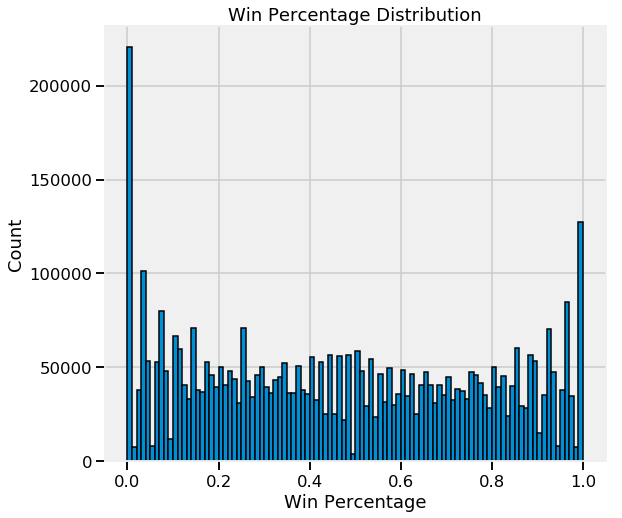

In [114]:
#Here we are trying to see how spread our target variable values are by plotting it.
figsize(8,8)

plt.hist(target, bins = 100, edgecolor = 'k');
plt.xlabel('Win Percentage'); plt.ylabel('Count'); 
plt.title('Win Percentage Distribution');

In [115]:
def encode(frame, feature):
    ordering = pd.DataFrame()
    # extracting unique values from a feature(column)
    ordering['val'] = frame[feature].unique()
    # assigning the unique values to the index of the dataframe
    ordering.index = ordering.val
    # creating a column ordering with values assinged from 1 to the number of unique values
    ordering['ordering'] = range(1, ordering.shape[0]+1)
    # creating a dict with the unique values as keys and the corresponding 
    # numbers in the ordering column as values
    ordering = ordering['ordering'].to_dict()
    # adding the encoded values into the original dataframe within new columns for each feature 
    for cat, o in ordering.items():
        frame.loc[frame[feature] == cat, feature+'_E'] = o
    
qual_encoded = []
# encoding all the features in the qualitative list
for q in qual:  
    encode(data, q)
    qual_encoded.append(q+'_E')
qual_encoded

['matchType_E']

In [116]:
features = quant + qual_encoded 
train_data = data[features]#.drop(target_col, axis=1)

In [117]:
train_data.columns

Index(['assists', 'boosts', 'damageDealt', 'DBNOs', 'headshotKills', 'heals',
       'killPlace', 'killPoints', 'kills', 'killStreaks', 'longestKill',
       'matchDuration', 'maxPlace', 'numGroups', 'rankPoints', 'revives',
       'rideDistance', 'roadKills', 'swimDistance', 'teamKills',
       'vehicleDestroys', 'walkDistance', 'weaponsAcquired', 'winPoints',
       'matchType_E'],
      dtype='object')

            feature    target
6         killPlace -0.720767
11    matchDuration -0.002240
7        killPoints  0.016520
24      matchType_E  0.019696
19        teamKills  0.023208
17        roadKills  0.038608
23        winPoints  0.039435
12         maxPlace  0.045357
13        numGroups  0.050263
14       rankPoints  0.064634
20  vehicleDestroys  0.073959
18     swimDistance  0.234142
15          revives  0.253557
3             DBNOs  0.258729
4     headshotKills  0.282433
0           assists  0.299501
9       killStreaks  0.393392
16     rideDistance  0.432261
8             kills  0.432542
2       damageDealt  0.448591
10      longestKill  0.456501
5             heals  0.565478
22  weaponsAcquired  0.666185
1            boosts  0.681427
21     walkDistance  0.866519


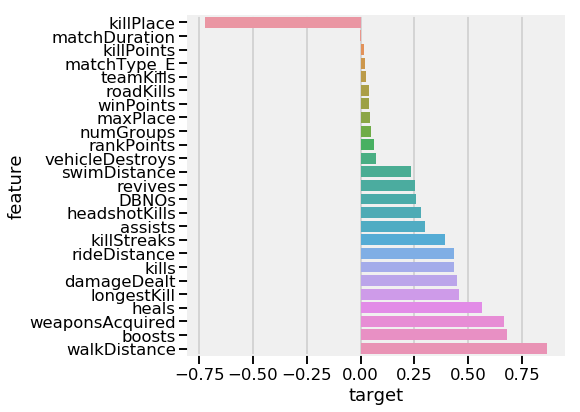

In [118]:
def feat_correlation(frame, features, target_col):
    corr = pd.DataFrame()
    corr['feature'] = features
    corr['target'] = [frame[f].corr(frame[target_col], 'spearman') for f in features]
    corr = corr.sort_values('target')
    print(corr)
    plt.figure(figsize=(6, 0.25*len(features)))
    sns.barplot(data=corr, y='feature', x='target', orient='h')
    return corr
    
corr = feat_correlation(data, features, 'winPlacePerc')

In [119]:
corr[corr.target > 0.2].feature

18       swimDistance
15            revives
3               DBNOs
4       headshotKills
0             assists
9         killStreaks
16       rideDistance
8               kills
2         damageDealt
10        longestKill
5               heals
22    weaponsAcquired
1              boosts
21       walkDistance
Name: feature, dtype: object

In [120]:
def corr_df(x, corr_val):
    '''
    Obj: Drops features that are strongly correlated to other features.
          This lowers model complexity, and aids in generalizing the model.
    Inputs:
          df: features df (x)
          corr_val: Columns are dropped relative to the corr_val input (e.g. 0.8)
    Output: df that only includes uncorrelated features
    '''

    # Creates Correlation Matrix and Instantiates
    corr_matrix = x.corr()
    iters = range(len(corr_matrix.columns) - 1)
    drop_cols = []

    # Iterates through Correlation Matrix Table to find correlated columns
    for i in iters:
        for j in range(i):
            item = corr_matrix.iloc[j:(j+1), (i+1):(i+2)]
            col = item.columns
            row = item.index            
            val = item.values
            if val >= corr_val:
                # Prints the correlated feature set and the corr val
                print(col.values[0], "|", row.values[0], "|", round(val[0][0], 2))
                drop_cols.append(i)

    drops = sorted(set(drop_cols))[::-1]
    
    # Drops the correlated columns
    for i in drops:
        col = x.iloc[:, (i+1):(i+2)].columns.values
        df = x.drop(col, axis=1)

    return df

In [121]:
# Remove the collinear features above a specified correlation coefficient
features = corr_df(train_data, 0.6);

headshotKills | damageDealt | 0.61
kills | damageDealt | 0.89
kills | DBNOs | 0.71
kills | headshotKills | 0.67
killStreaks | damageDealt | 0.7
killStreaks | DBNOs | 0.65
longestKill | kills | 0.6
walkDistance | boosts | 0.64
winPoints | killPoints | 0.98


In [122]:
test_data = pd.read_csv("/Users/prashasyasrivastava/Downloads/test.csv")

In [123]:
test_data.head()

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,...,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints
0,9329eb41e215eb,676b23c24e70d6,45b576ab7daa7f,0,0,51.46,0,0,0,73,...,1500,0,0.0,0,0.0,0,0,588.0,1,0
1,639bd0dcd7bda8,430933124148dd,42a9a0b906c928,0,4,179.10,0,0,2,11,...,1503,2,4669.0,0,0.0,0,0,2017.0,6,0
2,63d5c8ef8dfe91,0b45f5db20ba99,87e7e4477a048e,1,0,23.40,0,0,4,49,...,1565,0,0.0,0,0.0,0,0,787.8,4,0
3,cf5b81422591d1,b7497dbdc77f4a,1b9a94f1af67f1,0,0,65.52,0,0,0,54,...,1465,0,0.0,0,0.0,0,0,1812.0,3,0
4,ee6a295187ba21,6604ce20a1d230,40754a93016066,0,4,330.20,1,2,1,7,...,1480,1,0.0,0,0.0,0,0,2963.0,4,0


In [124]:
# add features to quant list if they are int or float type
test_quant = [f for f in test_data.columns if test_data.dtypes[f] != 'object']
# add features to qualitative list if they are object type
test_qual = [f for f in test_data.columns if test_data.dtypes[f] == 'object']

In [125]:
test_qual = list(set(test_qual).difference(set(['Id', 'groupId', 'matchId'])))

In [126]:
test_qual_encoded = []
# encoding all the features in the qualitative list
for q in test_qual:  
    encode(test_data, q)
    test_qual_encoded.append(q+'_E')
test_qual_encoded

['matchType_E']

In [127]:
test_features = test_quant + test_qual_encoded

In [128]:
test_features

['assists',
 'boosts',
 'damageDealt',
 'DBNOs',
 'headshotKills',
 'heals',
 'killPlace',
 'killPoints',
 'kills',
 'killStreaks',
 'longestKill',
 'matchDuration',
 'maxPlace',
 'numGroups',
 'rankPoints',
 'revives',
 'rideDistance',
 'roadKills',
 'swimDistance',
 'teamKills',
 'vehicleDestroys',
 'walkDistance',
 'weaponsAcquired',
 'winPoints',
 'matchType_E']

In [129]:
train_data.columns

Index(['assists', 'boosts', 'damageDealt', 'DBNOs', 'headshotKills', 'heals',
       'killPlace', 'killPoints', 'kills', 'killStreaks', 'longestKill',
       'matchDuration', 'maxPlace', 'numGroups', 'rankPoints', 'revives',
       'rideDistance', 'roadKills', 'swimDistance', 'teamKills',
       'vehicleDestroys', 'walkDistance', 'weaponsAcquired', 'winPoints',
       'matchType_E'],
      dtype='object')

In [130]:
model_lr_test = LinearRegression(n_jobs=-1)
model_lr_test.fit(train_data, target)
y_lr_pred = model_lr_test.predict(test_data[test_features])

## We get a submission file with predicted values under the target variable- WinPlacePerc

In [131]:
submission = pd.DataFrame({'Id': test_data['Id'], 'winPlacePerc': list(y_lr_pred)})

In [132]:
submission.to_csv("/Users/prashasyasrivastava/Downloads/LRsubmission.csv",index=False)

## Random Forest

- It is an excellent decision-making algorithm because of its capability to perform regression and classification
- It works well for both i.e categorical and numerical variables. 

In [134]:
import numpy as np
import pandas as pd
import os
import gc
import sys
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
#from sklearn_pandas import DataFrameMapper
from sklearn.preprocessing import LabelEncoder, Imputer, StandardScaler
from pandas.api.types import is_string_dtype, is_numeric_dtype
from sklearn.ensemble import forest
from sklearn.tree import export_graphviz

def change_columns_to_num(input_data,columns_from,columns_new):
    for column in columns_new:
        input_data[column]=np.where(input_data[columns_from]==column,1,0)
    input_data=input_data.drop(columns_from,axis=1)
    return input_data

csv_path="/Users/prashasyasrivastava/Downloads/train.csv"
data=pd.read_csv(csv_path)
data.describe()
data.isnull().sum()
data=data.dropna(axis=0) 

y=data.winPlacePerc
X=data.copy()
X=change_columns_to_num(X,"matchType",["solo", "duo", "squad", "solo-fpp", "duo-fpp", "squad-fpp"])
X=X.drop(["Id","groupId","matchId","winPlacePerc","longestKill"],axis=1)
del data
print (gc.collect())


train_X, val_X, train_y, val_y = train_test_split(X, y, random_state=1,test_size=0.2)

#model = RandomForestRegressor(n_estimators=20,n_jobs=-1,random_state=1,verbose=3,max_features=0.5, min_samples_leaf=3,oob_score=False)
#min_samples_leaf=5
#max_features="auto"
#max_leaf_nodes=-1
#min_samples_split=2
#max_depth=20
#oob_score=False


model = RandomForestRegressor(n_estimators=40,n_jobs=-1,verbose=3, min_samples_leaf=4,oob_score=False,
max_features="auto",max_depth=20,min_samples_split=2,max_leaf_nodes=-1)
model.fit(train_X,train_y)

predict_result=model.predict(val_X)
MAE=mean_absolute_error(val_y,predict_result)
del model
gc.collect()
print ("MAE="+str(MAE))


final_model = RandomForestRegressor(n_estimators=100,n_jobs=-1,verbose=3, min_samples_leaf=4,oob_score=False,
max_features="auto",max_depth=20,min_samples_split=2,max_leaf_nodes=-1)
final_model.fit(X,y)
del X
del y
print (gc.collect())

test_data_path = "/Users/prashasyasrivastava/Downloads/test.csv"
test_data=pd.read_csv(test_data_path)
test_data_Id=test_data.Id

test_X=change_columns_to_num(test_data,"matchType",
                      ["solo", "duo", "squad", "solo-fpp", "duo-fpp", "squad-fpp"])
test_X=test_X.drop(["Id","groupId","matchId","longestKill"],axis=1)
test_X.assign(ka=(test_X.kills+test_X.assists/2))
del test_data
print (gc.collect())

test_predict_result=final_model.predict(test_X)

output = pd.DataFrame({'Id': test_data_Id,
                       'winPlacePerc': test_predict_result})
output.to_csv("/Users/prashasyasrivastava/Downloads/RFsubmission.csv", index=False)

13647


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.


building tree 1 of 40
building tree 2 of 40building tree 3 of 40building tree 4 of 40


building tree 5 of 40
building tree 6 of 40
building tree 7 of 40
building tree 8 of 40
building tree 9 of 40
building tree 10 of 40
building tree 11 of 40
building tree 12 of 40
building tree 13 of 40
building tree 14 of 40
building tree 15 of 40
building tree 16 of 40
building tree 17 of 40
building tree 18 of 40
building tree 19 of 40
building tree 20 of 40
building tree 21 of 40
building tree 22 of 40building tree 23 of 40

building tree 24 of 40
building tree 25 of 40
building tree 26 of 40
building tree 27 of 40
building tree 28 of 40


[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:  9.9min


building tree 29 of 40
building tree 30 of 40
building tree 31 of 40
building tree 32 of 40
building tree 33 of 40
building tree 34 of 40
building tree 35 of 40
building tree 36 of 40
building tree 37 of 40
building tree 38 of 40
building tree 39 of 40
building tree 40 of 40


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed: 15.8min finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    4.4s
[Parallel(n_jobs=4)]: Done  40 out of  40 | elapsed:    7.3s finished


MAE=0.05775003432479775


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.


building tree 1 of 100building tree 2 of 100
building tree 3 of 100building tree 4 of 100


building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100building tree 28 of 100



[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed: 11.4min


building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54 of 100
building tree 55 of 100
building tree 56 of 100
building tree 57 of 100
building tree 58 of 100
building tree 59 of 100
building tree 60 of 100
building tree 61 of 100
building tree 62 of 100building tree 63 of 100

building tree 64 of 100
building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70

[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 48.3min finished


6
101


[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   10.7s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:   48.2s finished


## Light Gradient Boosting Model

- The main reason why we used this model is because of the size of the dataset. Since we have 29 variables and rows in millions, we needed an algorithm that accomodates these challenges and works well.
- LGBM gave us speedy outcome and is excellent with efficient memory allocation.

In [30]:
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
import warnings
warnings.filterwarnings("ignore")
from sklearn.preprocessing import StandardScaler

In [31]:
import lightgbm as lgb

In [32]:
import gc

In [138]:
conda install -c conda-forge lightgbm 

Solving environment: done

## Package Plan ##

  environment location: /Users/prashasyasrivastava/anaconda3

  added / updated specs:
    - lightgbm


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    certifi-2019.3.9           |           py37_0         149 KB  conda-forge
    conda-4.6.14               |           py37_0         2.1 MB  conda-forge
    lightgbm-2.2.3             |   py37h0a44026_0         645 KB  conda-forge
    openssl-1.1.1b             |       h1de35cc_1         3.5 MB  conda-forge
    ------------------------------------------------------------
                                           Total:         6.3 MB

The following packages will be UPDATED:

  lightgbm                             2.2.2-py37h0a44026_0 --> 2.2.3-py37h0a44026_0

The following packages will be SUPERSEDED by a higher-priority channel:

  certifi                                         pkgs/main --

In [139]:
conda install -c conda-forge/label/cf201901 lightgbm

Solving environment: done

## Package Plan ##

  environment location: /Users/prashasyasrivastava/anaconda3

  added / updated specs:
    - lightgbm


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    certifi-2019.3.9           |           py37_0         155 KB
    ------------------------------------------------------------
                                           Total:         155 KB

The following packages will be SUPERSEDED by a higher-priority channel:

  certifi                                       conda-forge --> pkgs/main



certifi-2019.3.9     | 155 KB    | ##################################### | 100% 
Preparing transaction: done
Verifying transaction: done
Executing transaction: done

Note: you may need to restart the kernel to use updated packages.


In [92]:
test = pd.read_csv("/Users/prashasyasrivastava/Downloads/test.csv")
test.head()

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,...,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints
0,9329eb41e215eb,676b23c24e70d6,45b576ab7daa7f,0,0,51.46,0,0,0,73,...,1500,0,0.0,0,0.0,0,0,588.0,1,0
1,639bd0dcd7bda8,430933124148dd,42a9a0b906c928,0,4,179.10,0,0,2,11,...,1503,2,4669.0,0,0.0,0,0,2017.0,6,0
2,63d5c8ef8dfe91,0b45f5db20ba99,87e7e4477a048e,1,0,23.40,0,0,4,49,...,1565,0,0.0,0,0.0,0,0,787.8,4,0
3,cf5b81422591d1,b7497dbdc77f4a,1b9a94f1af67f1,0,0,65.52,0,0,0,54,...,1465,0,0.0,0,0.0,0,0,1812.0,3,0
4,ee6a295187ba21,6604ce20a1d230,40754a93016066,0,4,330.20,1,2,1,7,...,1480,1,0.0,0,0.0,0,0,2963.0,4,0


In [93]:
train = pd.read_csv("/Users/prashasyasrivastava/Downloads/train.csv")
train.head()

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,...,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
0,7f96b2f878858a,4d4b580de459be,a10357fd1a4a91,0,0,0.00,0,0,0,60,...,0,0.0000,0,0.00,0,0,244.80,1,1466,0.4444
1,eef90569b9d03c,684d5656442f9e,aeb375fc57110c,0,0,91.47,0,0,0,57,...,0,0.0045,0,11.04,0,0,1434.00,5,0,0.6400
2,1eaf90ac73de72,6a4a42c3245a74,110163d8bb94ae,1,0,68.00,0,0,0,47,...,0,0.0000,0,0.00,0,0,161.80,2,0,0.7755
3,4616d365dd2853,a930a9c79cd721,f1f1f4ef412d7e,0,0,32.90,0,0,0,75,...,0,0.0000,0,0.00,0,0,202.70,3,0,0.1667
4,315c96c26c9aac,de04010b3458dd,6dc8ff871e21e6,0,0,100.00,0,0,0,45,...,0,0.0000,0,0.00,0,0,49.75,2,0,0.1875


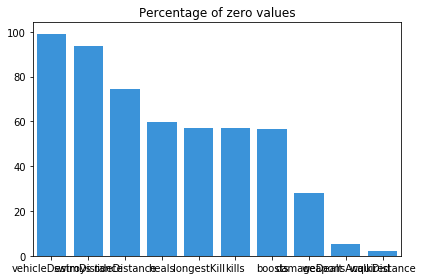

In [35]:
features = ['kills', 'longestKill', 'damageDealt', 'heals', 'boosts', 'walkDistance', 'swimDistance', 'rideDistance', 'weaponsAcquired', 'vehicleDestroys']
zeroPerc = ((train[features] == 0).sum(0) / len(train)*100).sort_values(ascending = False)
sns.barplot(x=zeroPerc.index , y=zeroPerc, color="#2196F3");
plt.title("Percentage of zero values")
plt.tight_layout()

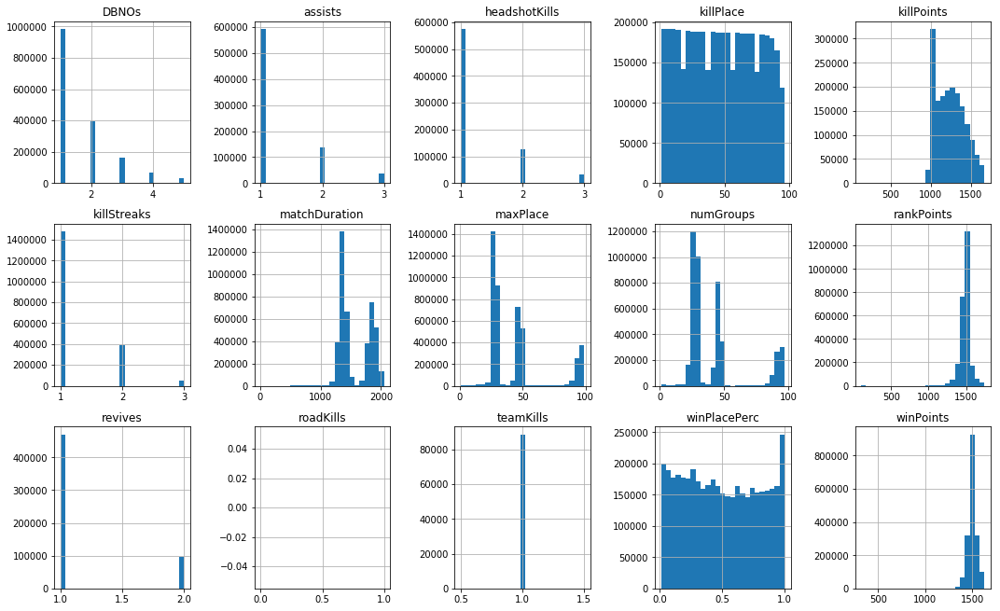

In [36]:
df = train.drop(columns=['Id','matchId','groupId','matchType']+features)
df[(df>0) & (df<=df.quantile(0.99))].hist(bins=25,layout=(5,5),figsize=(15,15));
plt.tight_layout()

# Saving time and memory with big datasets
 The size of the dataset is pretty big. Implementing a script to make the dataset smaller without losing information can save us a lot of time. I did not create this script, the credit goes to https://www.kaggle.com/gemartin/load-data-reduce-memory-usage

This script uses the following approach:

Iterate over every column Determine if the column is numeric Determine if the column can be represented by an integer Find the min and the max value Determine and apply the smallest datatype that can fit the range of values

In [38]:
def reduce_mem_usage(df): 
    """ iterate through all the columns of a dataframe and modify the data type to reduce memory usage."""
start_mem = df.memory_usage().sum() / 1024**2
print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))

Memory usage of dataframe is 508.91 MB


In [39]:
def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))

    for col in df.columns:
        col_type = df[col].dtype

        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    return df

# Dropping features
First of all, we want to drop some feature which may not be relevant for our problem:

ID, groupId: in the future, we may want to treat our data set as a "cluster" of many games (grouping by matches or by player ID), but for this first iteration let's just drop these features and not take into account these dependencies. longestKill, rankPoints: in the description, these features are stated as "inconsistent", so let's just drop them. numGroups: this feature is very similar to maxPlace. Let's drop it. matchType: this feature is somewhat redundant with maxPlace, since for example, on a duo-type game, maxPlace ~ 50. Let's drop it.

In [41]:
def initial_preparing(df, Debug):
    if Debug:
        df = df[df['matchId'].isin(df['matchId'].unique()[:2000])]
    # Drop next columns. *Points features don't correlate with target feature, need
    # more EDA to understand how they work.
    df.drop(columns=['killPoints','rankPoints','winPoints','matchType','maxPlace','Id'],inplace=True)
    X = df.groupby(['matchId','groupId']).agg(np.mean)
    X = reduce_mem_usage(X)
    y = X['winPlacePerc']     
    X.drop(columns=['winPlacePerc'],inplace=True)
    X_ranked = X.groupby('matchId').rank(pct=True)
    X = X.reset_index()[['matchId','groupId']].merge(X_ranked, how='left', on=['matchId', 'groupId'] )
    X.drop(['matchId','groupId'],axis=1, inplace=True)
    X = reduce_mem_usage(X)
    return X, y

In [42]:
X_train, y = initial_preparing(train.copy(),False)

Memory usage of dataframe is 356.01 MB
Memory usage after optimization is: 112.47 MB
Decreased by 68.4%
Memory usage of dataframe is 324.72 MB
Memory usage after optimization is: 92.78 MB
Decreased by 71.4%


In [43]:
from sklearn.model_selection import train_test_split
X_train, X_holdout, y_train, y_holdout = train_test_split(X_train, y, test_size=0.2, random_state=666)

In [44]:
from sklearn.model_selection import cross_val_score
import sklearn.metrics
from sklearn.model_selection import GridSearchCV

In [45]:
%%time
lgtrain = lgb.Dataset(X_train, label=y_train.reset_index(drop=True))
res = lgb.cv({'metric': 'mae'},lgtrain, nfold=5,stratified=False,seed=666)
print("Mean score:",res['l1-mean'][-1])
gc.collect()

Mean score: nan
CPU times: user 1min 37s, sys: 5.88 s, total: 1min 43s
Wall time: 30.5 s


In [46]:
team_features = {
        'assists': [sum, np.mean, np.size], #np.size - size of team
        'boosts' : [sum, np.var, np.mean], 
        'heals': [sum, np.var, np.mean],
        'damageDealt': [np.var,min,max,np.mean],
        'DBNOs': [np.var,max,np.mean],
        'headshotKills': [max,np.mean],
        'killPlaceScall':[sum, min,max, np.var, np.mean],
        'kills': [ sum, max, np.var,np.mean],
        'killStreaks': [max,np.var,np.mean],
        'longestKill': [max, np.mean, np.var],
        'revives': sum,
        'rideDistance': [sum, np.mean,np.var],
        'swimDistance': [np.var],
        'teamKills': sum,
        'vehicleDestroys': sum,
        'walkDistance': [np.var,np.mean],
        'weaponsAcquired': [np.mean],
        'damageRate': [np.var,min,max,np.mean],
        'headshotRate': [np.var,max,np.mean],
        'killStreakRate': [np.var,np.max, np.mean],
        'healthItems': [np.var, np.mean],
        'healsOnKill': [ np.var, np.mean],
        'sniper': [ np.var, np.mean],
        'totalDistance': [sum, np.var, np.mean],
        'totalDistancePen': [ sum ,np.var, np.mean],
        'killsPerRoadDist': [np.mean],
        'killsPerWalkDist': [np.mean],
        'killsPerDist': [np.mean],
        'distance_over_weapons': [np.mean],
        'walkDistance_over_heals': [np.mean],
        'skill': [np.var,np.mean]
}

In [47]:
#I choose 5 folds in cross-validation. We have a big dataset, so it's not necessary to set more folds, 80% for train part is enough to train model. Moreover, If I choose higher number, than it will take a lot of time to compute.

In [48]:
def featuring(df, isTrain, Debug):
    y=None
    if Debug:
        df = df[df['matchId'].isin(df['matchId'].unique()[:2000])]
 
    #Creating new features
    #_________________________________________________________________________________________

    nplayers = df.groupby('matchId')['matchId'].transform('count')
    df['killPlaceScall'] = df['killPlace'] / nplayers
    df['damageRate'] = df['kills']/(0.01*df['damageDealt'])
    df['headshotRate'] = df['headshotKills']/df['kills']
    df['killStreakRate'] = df['killStreaks']/df['kills']
    df['healthItems'] = df['heals'] + df['boosts']
    df['healsOnKill'] = df['healthItems']/df['kills']
    df['sniper'] = df['longestKill']/100*df['weaponsAcquired']
    df['totalDistance'] = df['rideDistance'] + df["walkDistance"] + df["swimDistance"]
    df['totalDistancePen'] = df['rideDistance']/5 + df["walkDistance"] + df["swimDistance"]*10
    df['killsPerRoadDist'] = df['roadKills'] / (df['rideDistance']+1)
    df['killsPerWalkDist'] = (df['kills']-df['roadKills']) / (df['walkDistance']+1)
    df['killsPerDist'] = df['kills']/(df['totalDistance']+1)
    df['distance_over_weapons'] = df['totalDistance'] / df['weaponsAcquired']
    df['walkDistance_over_heals'] = df['walkDistance']/100/df['heals']
    df["skill"] = df["headshotKills"] + df["roadKills"] - df['teamKills'] 
    df.fillna(0,inplace=True)
    df.replace(np.inf, 0, inplace=True)
    #_________________________________________________________________________________________
    
    ids = df[['matchId','groupId','Id']]
    df.drop(columns=['killPlace','killPoints','rankPoints','winPoints','matchType','maxPlace','Id'],inplace=True)
    
    tfeatures = team_features.copy()
    if isTrain:
        tfeatures['winPlacePerc'] = max
    X = df.groupby(['matchId','groupId']).agg(tfeatures)
    X.fillna(0,inplace=True)
    X.replace(np.inf, 1000000, inplace=True)
    X = reduce_mem_usage(X)    
    if isTrain:
        y = X[('winPlacePerc','max')]     
        X.drop(columns=[('winPlacePerc','max')],inplace=True)
             
   
    #Group dataset by matches. To each match apply ranking 
    X_ranked = X.groupby('matchId').rank(pct=True)    
    X = X.reset_index()[['matchId','groupId']].merge(X_ranked, suffixes=["", "_rank"], how='left', on=['matchId', 'groupId'] )

    ids_after = X[['matchId','groupId']]
    ids_after.columns = ['matchId','groupId']
    
    X = X.drop(['matchId','groupId'],axis=1)
    X.columns = [a+"_"+b for a,b in X.columns]
    X = reduce_mem_usage(X)
    
    return X, y, ids,ids_after

In [49]:
%%time
X_train, y, _,_ = featuring(train,True,False)
X_test, _,ids_init,ids_after = featuring(test,False,False)

Memory usage of dataframe is 1160.08 MB
Memory usage after optimization is: 340.55 MB
Decreased by 70.6%
Memory usage of dataframe is 1128.79 MB
Memory usage after optimization is: 293.79 MB
Decreased by 74.0%
Memory usage of dataframe is 498.81 MB
Memory usage after optimization is: 139.61 MB
Decreased by 72.0%
Memory usage of dataframe is 493.59 MB
Memory usage after optimization is: 128.47 MB
Decreased by 74.0%
CPU times: user 5min 44s, sys: 2min 5s, total: 7min 49s
Wall time: 5min 52s


In [50]:
%%time
lgtrain = lgb.Dataset(X_train, label=y_train.reset_index(drop=True))
res = lgb.cv({'metric': 'mae'},lgtrain, nfold=5,stratified=False,seed=666)
print("Mean score:",res['l1-mean'][-1])

Mean score: nan
CPU times: user 1min 38s, sys: 4.07 s, total: 1min 42s
Wall time: 28 s


In [51]:
gridParams = {
    'num_leaves': [30,50,100], 'max_depth': [-1,8,15], 
    'min_data_in_leaf': [100,300,500], 'max_bin': [250,500], 
    'lambda_l1': [0.01], 'num_iterations': [5], 
    'nthread': [4], 'seed': [666],
    'learning_rate': [0.05], 'metric': ['mae'],
    "bagging_fraction" : [0.7], "bagging_seed" : [0], "colsample_bytree" : [0.7]
    }
model = lgb.LGBMRegressor()
grid = GridSearchCV(model, gridParams,
                    verbose=1,
                    cv=5)

In [52]:
%%time
grid.fit(X_train.iloc[:500000,:], y_train.iloc[:500000])

Fitting 5 folds for each of 54 candidates, totalling 270 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 270 out of 270 | elapsed:  8.0min finished


CPU times: user 26min 4s, sys: 2min 38s, total: 28min 42s
Wall time: 8min 1s


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
       importance_type='split', learning_rate=0.1, max_depth=-1,
       min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
       n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
       random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
       subsample=1.0, subsample_for_bin=200000, subsample_freq=0),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'num_leaves': [30, 50, 100], 'max_depth': [-1, 8, 15], 'min_data_in_leaf': [100, 300, 500], 'max_bin': [250, 500], 'lambda_l1': [0.01], 'num_iterations': [5], 'nthread': [4], 'seed': [666], 'learning_rate': [0.05], 'metric': ['mae'], 'bagging_fraction': [0.7], 'bagging_seed': [0], 'colsample_bytree': [0.7]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [53]:
print("Best params:", grid.best_params_)
print("\nBest score:", grid.best_score_)
params = grid.best_params_

Best params: {'bagging_fraction': 0.7, 'bagging_seed': 0, 'colsample_bytree': 0.7, 'lambda_l1': 0.01, 'learning_rate': 0.05, 'max_bin': 500, 'max_depth': -1, 'metric': 'mae', 'min_data_in_leaf': 100, 'nthread': 4, 'num_iterations': 5, 'num_leaves': 100, 'seed': 666}

Best score: 0.36524363212480465


In [54]:
##LightGBM

In [55]:
from sklearn.model_selection import KFold, StratifiedKFold, train_test_split
from sklearn.metrics import mean_absolute_error

In [94]:
def oof_model_preds(df, model, num_folds, params):
    # Divide in training/validation and test data
    train_df = df[df['winPlacePerc'].notnull()]
    test_df = df[df['winPlacePerc'].isnull()]
    print("Starting LightGBM. Train shape: {}, test shape: {}".format(train_df.shape, test_df.shape))
    del df
    gc.collect()

    # Create arrays and dataframes to store results
    oof_preds = np.zeros(train_df.shape[0])
    sub_preds = np.zeros(test_df.shape[0])
    feature_importance_df = pd.DataFrame()

    drop_features = ['Id', 'groupId', 'matchId', 'matchType', 'winPlacePerc']    
    feats = [f for f in train_df.columns if f not in drop_features]

    # Create model
    if num_folds == 1:
        train_x, valid_x, train_y, valid_y = train_test_split(train_df[feats], train_df['winPlacePerc'], test_size=0.2, random_state=1001)
        model.fit(train_x, train_y, eval_set=[(train_x, train_y), (valid_x, valid_y)],
            eval_metric= 'mae', verbose=params['verbose'], early_stopping_rounds=params['early_stopping_rounds'])

        oof_preds = model.predict(train_df[feats])
        sub_preds = model.predict(test_df[feats])

        fold_importance_df = pd.DataFrame()
        fold_importance_df["feature"] = feats
        fold_importance_df["importance"] = model.feature_importances_
        fold_importance_df["fold"] = 1
        feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
        print('MAE : %.6f' % (mean_absolute_error(train_df['winPlacePerc'], oof_preds)))
        del train_x, train_y, valid_x, valid_y
        gc.collect()

    # Cross validation model
    elif num_folds > 1:
        folds = KFold(n_splits= num_folds, shuffle=True, random_state=1001)
        for n_fold, (train_idx, valid_idx) in enumerate(folds.split(train_df[feats], train_df['winPlacePerc'])):
            train_x, train_y = train_df[feats].iloc[train_idx], train_df['winPlacePerc'].iloc[train_idx]
            valid_x, valid_y = train_df[feats].iloc[valid_idx], train_df['winPlacePerc'].iloc[valid_idx]

            model.fit(train_x, train_y, eval_set=[(train_x, train_y), (valid_x, valid_y)],
                eval_metric= 'mae', verbose=params['verbose'], early_stopping_rounds=params['early_stopping_rounds'])

            oof_preds[valid_idx] = model.predict(valid_x)
            sub_preds += model.predict(test_df[feats]) / folds.n_splits

            fold_importance_df = pd.DataFrame()
            fold_importance_df["feature"] = feats
            fold_importance_df["importance"] = model.feature_importances_
            fold_importance_df["fold"] = n_fold + 1
            feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
            print('Fold %2d MAE : %.6f' % (n_fold + 1, mean_absolute_error(valid_y, oof_preds[valid_idx])))
            del train_x, train_y, valid_x, valid_y
            gc.collect()

    print('Full MAE score %.6f' % mean_absolute_error(train_df['winPlacePerc'], oof_preds))
    return oof_preds, sub_preds, feature_importance_df

In [57]:
dataset = pd.concat([train, test], sort=True)
dataset = reduce_mem_usage(dataset)

Memory usage of dataframe is 1850.00 MB
Memory usage after optimization is: 486.84 MB
Decreased by 73.7%


In [58]:
import lightgbm as lgb

params = {
    'num_leaves': 144,
    'learning_rate': 0.1,
    'n_estimators': 800,
    'max_depth':12,
    'max_bin':55,
    'bagging_fraction':0.8,
    'bagging_freq':5,
    'feature_fraction':0.9,
    'verbose':50, 
    'early_stopping_rounds':100
    }

# LightGBM parameters
lgbm_reg = lgb.LGBMRegressor(num_leaves=params['num_leaves'], learning_rate=params['learning_rate'], 
                    n_estimators=params['n_estimators'], max_depth=params['max_depth'],
                    max_bin = params['max_bin'], bagging_fraction = params['bagging_fraction'], 
                    bagging_freq = params['bagging_freq'], feature_fraction = params['feature_fraction'],
                   )

lgb_oof_preds, lgb_sub_preds, lgb_feature_importance_df = oof_model_preds(dataset, lgbm_reg, num_folds=4, params=params)

Starting LightGBM. Train shape: (4446966, 37), test shape: (1934174, 37)
Training until validation scores don't improve for 100 rounds.
[50]	training's l2: 0.00637055	training's l1: 0.0570187	valid_1's l2: 0.00636231	valid_1's l1: 0.0569615
[100]	training's l2: 0.00613406	training's l1: 0.0558768	valid_1's l2: 0.00618679	valid_1's l1: 0.0559561
[150]	training's l2: 0.0060475	training's l1: 0.0555483	valid_1's l2: 0.0061506	valid_1's l1: 0.0557469
[200]	training's l2: 0.00598874	training's l1: 0.0553323	valid_1's l2: 0.0061371	valid_1's l1: 0.0556461
[250]	training's l2: 0.00594519	training's l1: 0.0551756	valid_1's l2: 0.00613087	valid_1's l1: 0.0555956
[300]	training's l2: 0.00590576	training's l1: 0.055026	valid_1's l2: 0.00612212	valid_1's l1: 0.0555459
[350]	training's l2: 0.00587111	training's l1: 0.0548947	valid_1's l2: 0.00611799	valid_1's l1: 0.0555118
[400]	training's l2: 0.00583835	training's l1: 0.0547756	valid_1's l2: 0.00611621	valid_1's l1: 0.055492
[450]	training's l2: 0

In [59]:
def display_importances(feature_importance_df_):
    cols = feature_importance_df_[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False)[:40].index
    best_features = feature_importance_df_.loc[feature_importance_df_.feature.isin(cols)]
    plt.figure(figsize=(8, 10))
    sns.barplot(x="importance", y="feature", data=best_features.sort_values(by="importance", ascending=False))
    plt.title('LightGBM Features (avg over folds)')
    plt.tight_layout()
    plt.savefig('lgbm_importances.png')

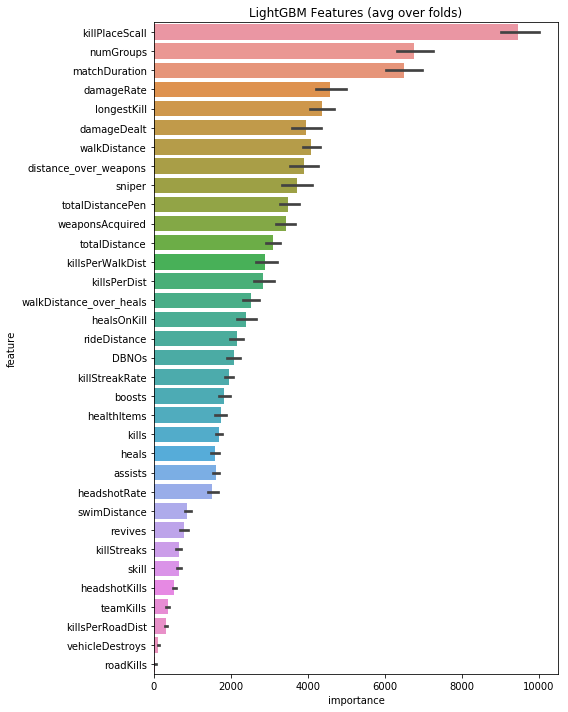

In [60]:
display_importances(lgb_feature_importance_df)

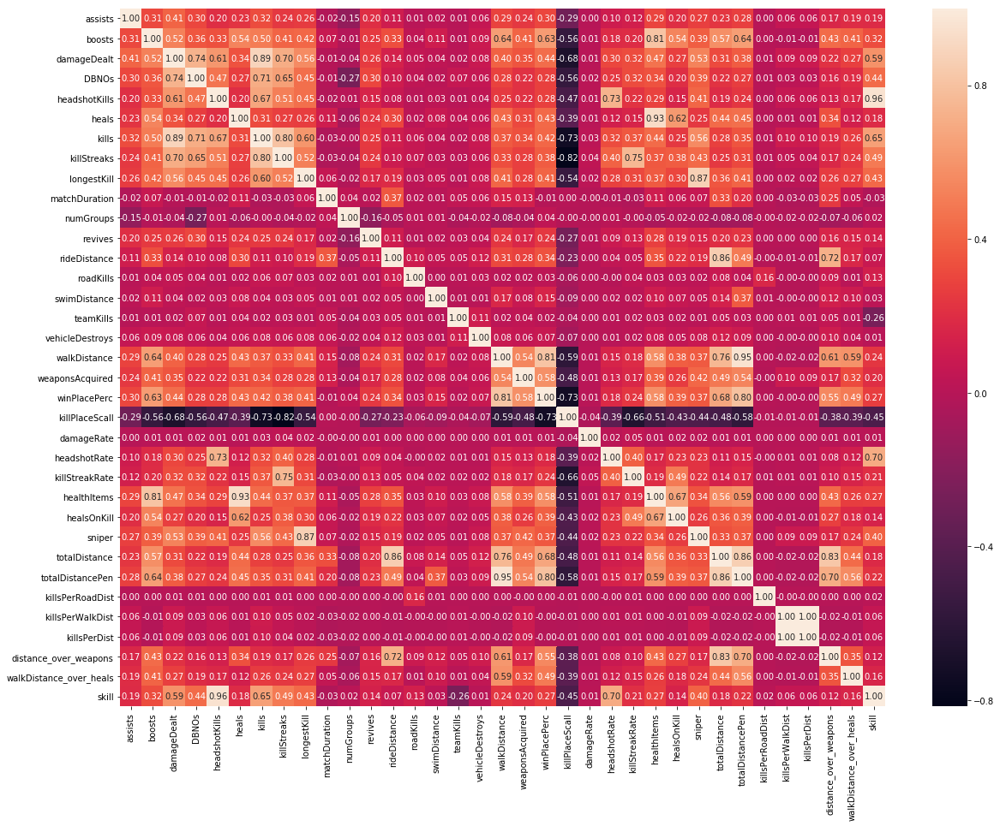

In [61]:
plt.figure(figsize=(20,15))
sns.heatmap(train.corr(), annot=True, fmt=".2f")
plt.show()

In [62]:
# Create and train model on train data sample
params = {
    'num_leaves': 2048,
    'learning_rate': 0.01,
    'n_estimators': 1000,
    #'max_depth':10,
    'min_data_in_leaf': 400,
    'max_bin': 1000,
    #'bagging_fraction':0.8,
    #'bagging_freq':5,
    #'feature_fraction':0.9,
    #'verbose':50,
    #'boosting_type': 'rf',
    'random_state': 42,
    'objective' : 'regression',
    'metric': 'mae'
    }

model = lgb.LGBMRegressor(**params, verbose=2, n_jobs=4, silent=False)
model.fit(X_train, y_train, eval_metric= 'mae')

LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
       importance_type='split', learning_rate=0.01, max_bin=1000,
       max_depth=-1, metric='mae', min_child_samples=20,
       min_child_weight=0.001, min_data_in_leaf=400, min_split_gain=0.0,
       n_estimators=1000, n_jobs=4, num_leaves=2048,
       objective='regression', random_state=42, reg_alpha=0.0,
       reg_lambda=0.0, silent=False, subsample=1.0,
       subsample_for_bin=200000, subsample_freq=0, verbose=2)

In [117]:
def preprocess_data(df, with_categorical=False):

    processed_df = df.drop(['Id', 'rankPoints'],  axis=1)
            
    # handle matchType column by creating dummies cols or creating new categorical variable column
    print('-'*5 + ' handling matchType column ' + '-'*5)
    new_matchType_cols = list()
    if with_categorical:
        for mtype in processed_df['matchType']:
            if mtype in ['squad', 'squad-fpp', 'normal-squad-fpp', 'normal-squad', 'flarefpp', 'flaretpp']:
                new_matchType_cols.append([3])
            elif mtype in ['solo', 'solo-fpp', 'normal-solo-fpp', 'normal-solo']:
                new_matchType_cols.append([1])
            else:
                new_matchType_cols.append([2])
        match_df = pd.DataFrame(new_matchType_cols, columns=['matchType'], index=processed_df.index)
        
    else:
        for mtype in processed_df['matchType']:
            if mtype in ['squad', 'squad-fpp', 'normal-squad-fpp', 'normal-squad', 'flarefpp', 'flaretpp']:
                new_matchType_cols.append([1, 0, 0])
            elif mtype in ['solo', 'solo-fpp', 'normal-solo-fpp', 'normal-solo']:
                new_matchType_cols.append([0, 0, 1])
            else:
                new_matchType_cols.append([0, 1, 0])
        match_df = pd.DataFrame(new_matchType_cols, columns=['squad','duo', 'solo'], index=processed_df.index)
        
    processed_df = processed_df.drop(['matchType'],  axis=1)
    
    # create matchSize column
    print('-'*5 + ' create matchSize column ' + '-'*5)
    match_size = processed_df.groupby(['matchId']).size().reset_index(name='matchSize')
    processed_df = processed_df.merge(match_size, how='left', on=['matchId'])
    
    # create teamSize column
    print('-'*5 + ' create teamSize column ' + '-'*5)
    processed_df['combinedId'] = processed_df['matchId'] + processed_df['groupId']
    group_size = processed_df.groupby(['combinedId']).size().reset_index(name='teamSize')
    processed_df = processed_df.merge(group_size, how='left', on=['combinedId'])
    
    # create totalDistance col
    print('-'*5 + ' create totalDistance column ' + '-'*5)
    processed_df['totalDistance'] = processed_df['rideDistance'] + processed_df['walkDistance'] + processed_df['swimDistance']
    #processed_df['headshotRate'] = processed_df['headshotKills'] / processed_df['kills']
    #processed_df['killstreaksRate'] = processed_df['killStreaks'] / processed_df['kills']
    
    processed_df = processed_df.drop(['combinedId', 'matchId', 'groupId'],  axis=1)
    processed_df = processed_df.join(match_df)
    
    # delete low importances features
    processed_df = processed_df.drop(['teamKills', 'vehicleDestroys', 'roadKills', 'swimDistance', 'headshotKills', 'solo', 'duo', 'squad'], 1)

    return processed_df

In [110]:
test = pd.read_csv("/Users/prashasyasrivastava/Downloads/test.csv")

In [111]:
train = pd.read_csv("/Users/prashasyasrivastava/Downloads/train.csv")

In [118]:
X_test = preprocess_data(test)
#X_test = pd.DataFrame(sc.fit_transform(X_test.values), index=X_test.index, columns=X_test.columns)
X_test.head()

----- handling matchType column -----
----- create matchSize column -----
----- create teamSize column -----
----- create totalDistance column -----


,assists,boosts,damageDealt,DBNOs,heals,killPlace,killPoints,kills,killStreaks,longestKill,...,maxPlace,numGroups,revives,rideDistance,walkDistance,weaponsAcquired,winPoints,matchSize,teamSize,totalDistance
0,0,0,51.46,0,0,73,0,0,0,0.00,...,28,28,0,0.0,588.0,1,0,92,4,588.0
1,0,4,179.10,0,2,11,0,2,1,361.90,...,48,47,2,4669.0,2017.0,6,0,96,2,6686.0
2,1,0,23.40,0,4,49,0,0,0,0.00,...,28,27,0,0.0,787.8,4,0,94,4,787.8
3,0,0,65.52,0,0,54,0,0,0,0.00,...,45,44,0,0.0,1812.0,3,0,89,2,1812.0
4,0,4,330.20,1,1,7,0,3,1,60.06,...,28,27,1,0.0,2963.0,4,0,95,3,2963.0


In [106]:
#drop('DBNOs')
X_test=X_test.drop('DBNOs',1)
X_train = train.drop('winPlacePerc', 1)

In [107]:
# Predict for test data sample
prediction = model.predict(X_test)

In [108]:
for i in range(len(test)):
    winPlacePerc = prediction[i]
    maxPlace = int(test.iloc[i]['maxPlace'])
    if maxPlace == 0:
        winPlacePerc = 0.0
    elif maxPlace == 1:
        winPlacePerc = 1.0
    else:
        gap = 1.0 / (maxPlace - 1)
        winPlacePerc = round(winPlacePerc / gap) * gap
    
    if winPlacePerc < 0: winPlacePerc = 0.0
    if winPlacePerc > 1: winPlacePerc = 1.0    
    prediction[i] = winPlacePerc

In [109]:
result_df = test.copy()
result_df['winPlacePerc'] = prediction

result_df.head()
result_df.to_csv("/Users/prashasyasrivastava/Downloads/LGBMsubmission.csv", columns=['Id', 'winPlacePerc'], index=False)

## Result:

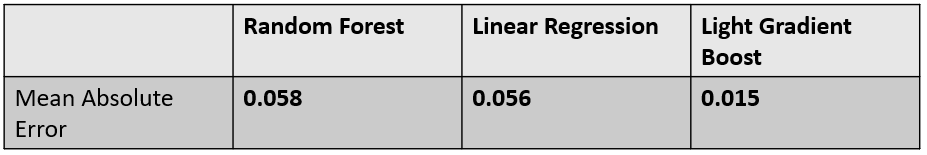

## Conclusion:

- We have used three model i.e Linear Regression, Random Forest and LightGBM and hence we can conclude that LightGBM has fit our dataset perfectly.
- We concluded this by comparing the accuracies of all the three models. LightGBM showed the lowest Mean Absolute Error(MAE) rate.
- Hence the predicted values by LightGBM model are precise and perfect.

## Insights: 

- We have presented many insights above in the notebook through various visualizations.

## Here are some Strategies followed by Top players:

- To play the game in SQUAD mode(team of 4 players)
- To cover maximum distance in the game by walking followed by driving.
- To avoid death one should not enter the red-zone and be inside the play area